In [50]:
pip install qiskit

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [51]:
pip install qiskit-aer

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [52]:
!pip install pylatexenc

/bin/bash: pip: command not found


In [53]:
pip install plotly==5.22.0

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [54]:
pip install nbformat>=4.2.0

You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [55]:
from qiskit_aer import Aer
from qiskit import QuantumCircuit, transpile, assemble
from qiskit.quantum_info import Statevector
from qiskit.visualization import plot_histogram, plot_bloch_multivector
from qiskit.circuit.library import QFT
import numpy as np
import matplotlib.pyplot as plt

In [56]:
from qiskit.circuit.library import Diagonal
from qiskit.quantum_info import Operator



---



# Function definitions

In [100]:
# Function to check and pad coefficients to a power of 2. modified to pad to power of two twice the lenght of coeffs
def pad_to_power_of_two(coeffs, window_length, filter_length):
    # length = len(coeffs)
    length = window_length + filter_length
    # next_power_of_two = 1 << (2*length - 1).bit_length()
    next_power_of_two = 1 << (length - 1).bit_length()
    return coeffs + [0] * (next_power_of_two - window_length)
    # return coeffs + [0] * (next_power_of_two - length)

# Function to normalize a vector
# def normalize(coeffs):
#     norm = np.linalg.norm(coeffs)
#     return [c / norm for c in coeffs]

# # For denormalizing and descaling filter normalization later
# def normalize_filter_norm(coeffs):
#     norm = np.linalg.norm(coeffs)
#     return norm

# Function for element-wise multiplication and normalization
def elementwise_multiply_and_normalize(coeffs_psi1, coeffs_psi2, start_index):
    end_index = start_index + len(coeffs_psi2)
    # Perform element-wise multiplication
    multiplied_coeffs = [coeffs_psi1[i] * coeffs_psi2[i - start_index] for i in range(start_index, end_index)]
    # Normalize the resulting coefficients
    norm = np.linalg.norm(multiplied_coeffs)
    normalized_coeffs = [c / norm for c in multiplied_coeffs]
    return normalized_coeffs, norm

    # Function to plot the squares of the amplitudes
def plot_amplitudes(coeffs, title):
    fig, ax = plt.subplots()
    ax.stem(range(len(coeffs)), np.real(coeffs), basefmt=" ") # to remove the depracation error
    ax.set_xlabel('State')
    ax.set_ylabel('Amplitude')
    ax.set_title(title)
    plt.show()

# Filter gate functions
# Function to generate an averaging filter
def averaging_filter(N):
    return np.ones(N) / N   # normalised

# Function to normalize a vector
def normalize(vector):
    norm = np.linalg.norm(vector)   # why do i have two normalize functions???
    return vector / norm, norm

# def plot_amplitudes(coeffs, title):
#     fig, ax = plt.subplots()
#     ax.stem(range(len(coeffs)), np.abs(coeffs), basefmt=" ")
#     ax.set_xlabel('State')
#     ax.set_ylabel('Amplitude')
#     ax.set_title(title)
#     plt.show()

def plot_amplitudes_side_by_side(coeffs1, coeffs2, title1, title2):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

    ax1.stem(range(len(coeffs1)), np.real(coeffs1), basefmt=" ")
    ax1.set_xlabel('State')
    ax1.set_ylabel('Amplitude')
    ax1.set_title(title1)

    ax2.stem(range(len(coeffs2)), np.real(coeffs2), basefmt=" ")
    ax2.set_xlabel('State')
    ax2.set_ylabel('Amplitude')
    ax2.set_title(title2)

    plt.tight_layout()
    plt.show()

# case of zeroes windowed state

Here zeroes state is not prepared neither is the convolution found. Overlap add loop has the index of convoutions and therby keeping track of it we can safely ignore not following thorugh with actually creating a zeroes convolution of approprutately padded lenght. Gotta verify if this is going to cause in certain cases.. For now it works


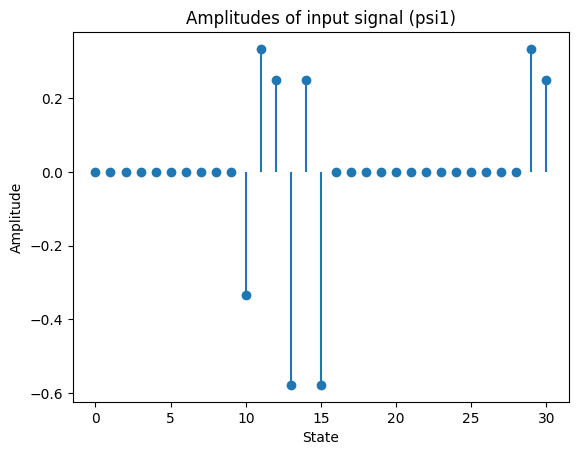


Averaging filter: [0.33333333 0.33333333 0.33333333]

Normalized averaging filter: [0.57735027 0.57735027 0.57735027]

Padded averaging filter: [0.5773502691896257, 0.5773502691896257, 0.5773502691896257, 0, 0, 0, 0, 0]

Window at index 0 is all zeroes. Skipping quantum circuit creation.

Window at index 3 is all zeroes. Skipping quantum circuit creation.

Window at index 6 is all zeroes. Skipping quantum circuit creation.

Start index at =  9



/Users/sqnair/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning:

urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020



final Resulting statevector: [ 3.39934989e-17-5.66558315e-18j -1.17851130e-01+6.52828036e-17j
 -2.48123922e-17+2.42337353e-17j -1.29905772e-17-2.29156904e-17j
  1.17851130e-01-5.56424003e-17j -1.13311663e-17-1.32485535e-17j
 -2.32616749e-17+8.20904626e-18j  2.10029217e-17-2.53357796e-19j]



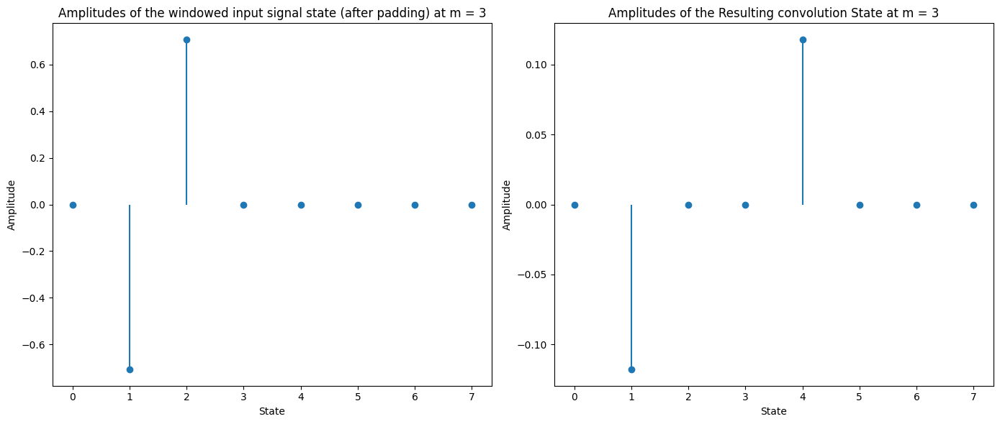

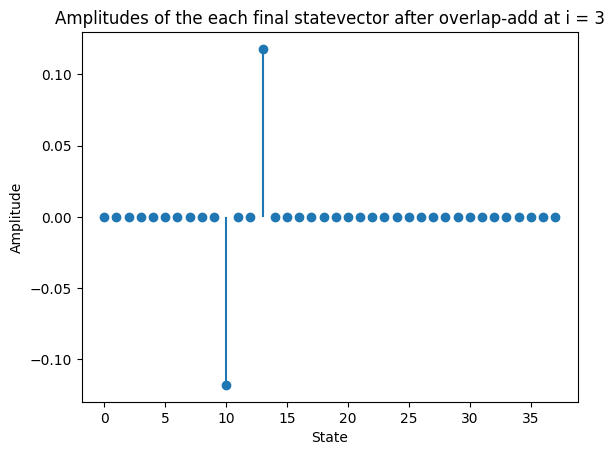


Start index at =  12

final Resulting statevector: [ 8.83883476e-02-2.65256351e-17j -1.15735798e-01+4.89446517e-17j
 -2.73474499e-02+4.61702923e-17j -1.15735798e-01+1.18678355e-17j
  8.83883476e-02-3.80324888e-17j -2.44097230e-17+2.50542967e-19j
  1.22048615e-17+1.76257527e-18j -2.44097230e-17+4.78106181e-18j]



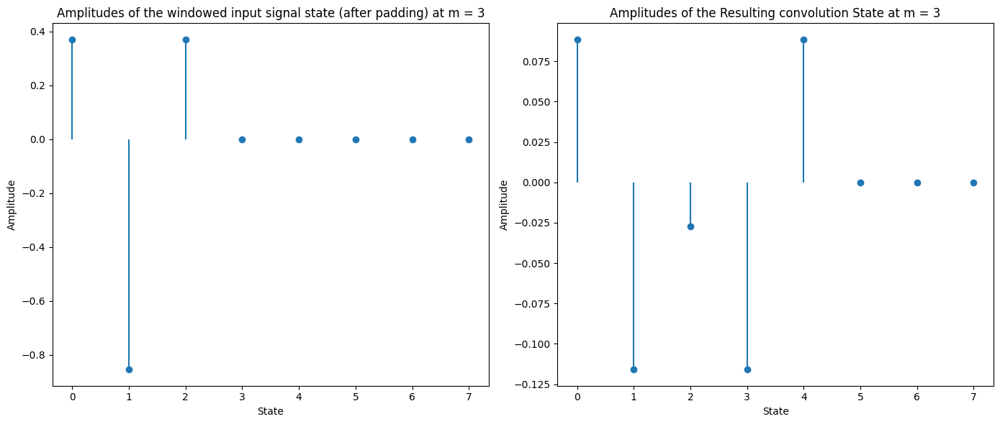

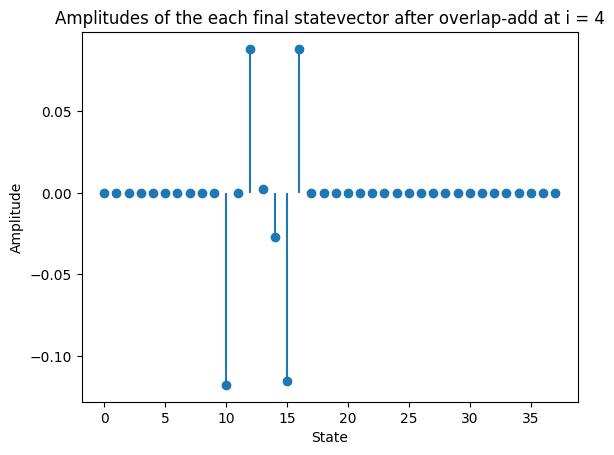


Start index at =  15

final Resulting statevector: [-2.04124145e-01-1.81761733e-18j -2.04124145e-01+6.06867312e-17j
 -2.04124145e-01+7.85669260e-17j -3.12250226e-17+1.17871296e-17j
 -2.77555756e-17-7.18945970e-18j -4.16333634e-17-2.31897341e-17j
 -2.77555756e-17-3.20628518e-17j  3.12250226e-17-3.67851277e-17j]



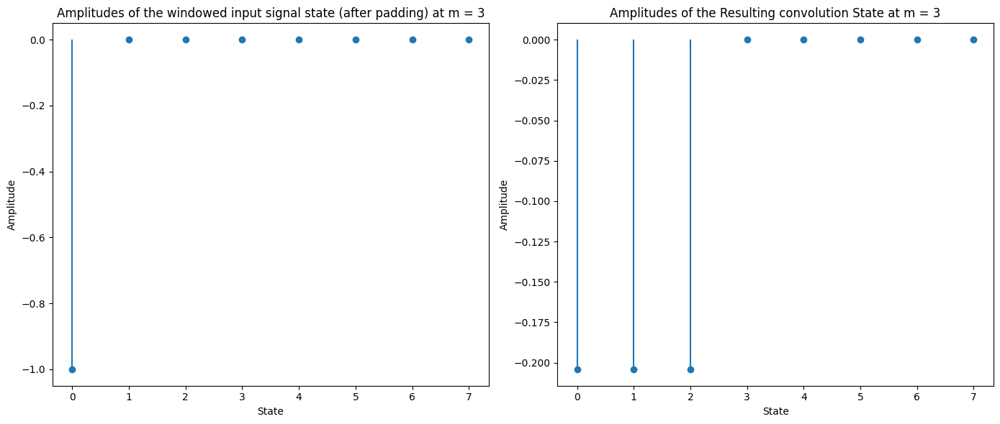

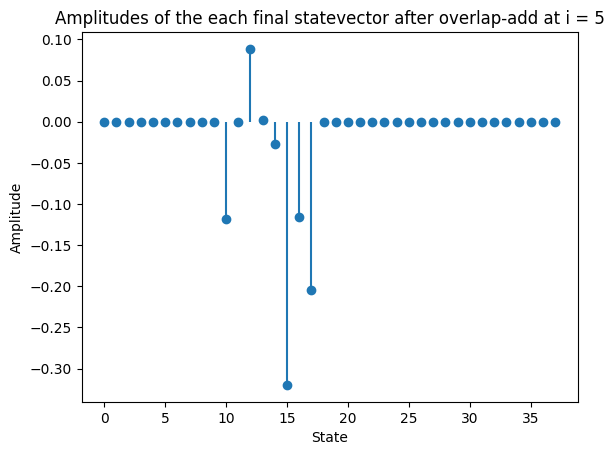


Window at index 18 is all zeroes. Skipping quantum circuit creation.

Window at index 21 is all zeroes. Skipping quantum circuit creation.

Window at index 24 is all zeroes. Skipping quantum circuit creation.

Start index at =  27

final Resulting statevector: [ 3.20493781e-17+3.02406844e-17j -4.69352276e-18+2.32409895e-17j
  1.17851130e-01-4.62240027e-17j  1.17851130e-01-5.56424003e-17j
  1.17851130e-01-6.35100806e-17j  2.73558553e-17-8.80838858e-18j
  1.60246891e-17+2.89792956e-17j  0.00000000e+00+1.95608980e-17j]



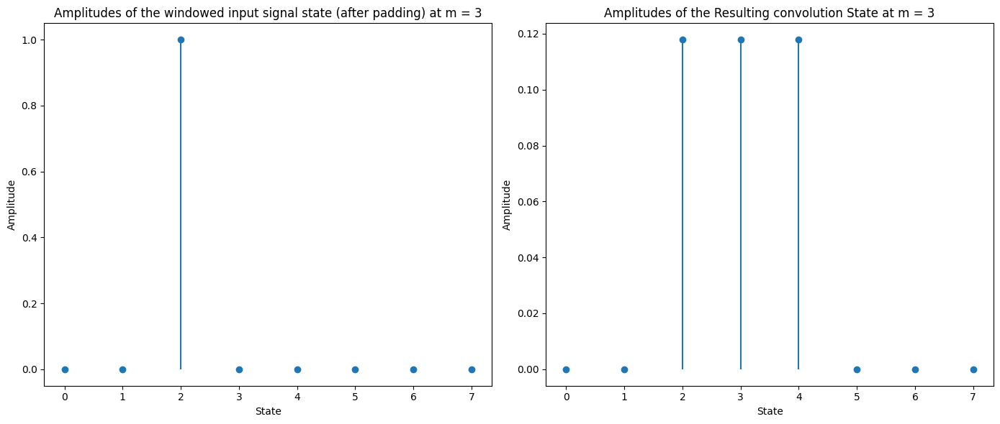

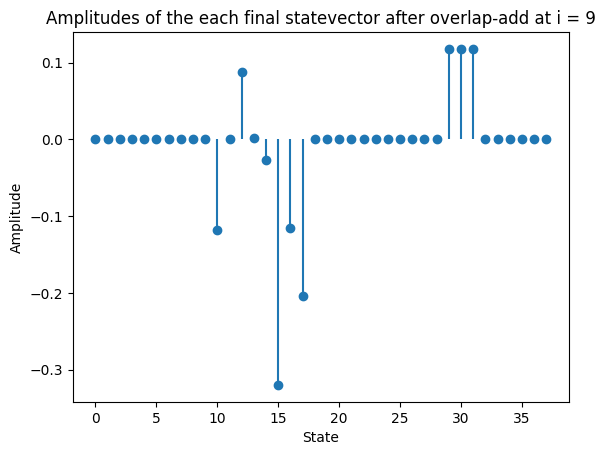


Start index at =  30

final Resulting statevector: [ 8.83883476e-02+7.87051391e-19j  8.83883476e-02-2.62781255e-17j
  8.83883476e-02-3.40204769e-17j  1.35208314e-17-5.10397684e-18j
  1.20185168e-17+3.11312737e-18j  1.80277752e-17+1.00414494e-17j
  1.20185168e-17+1.38836221e-17j -1.35208314e-17+1.59284275e-17j]



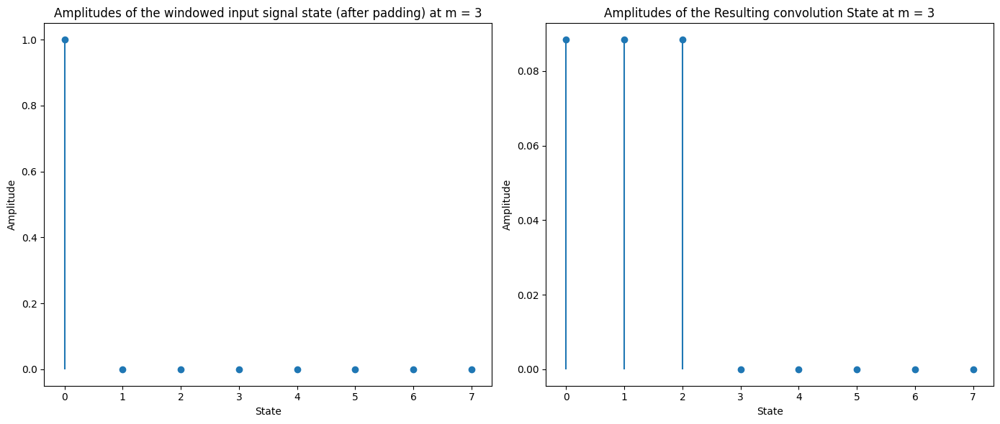

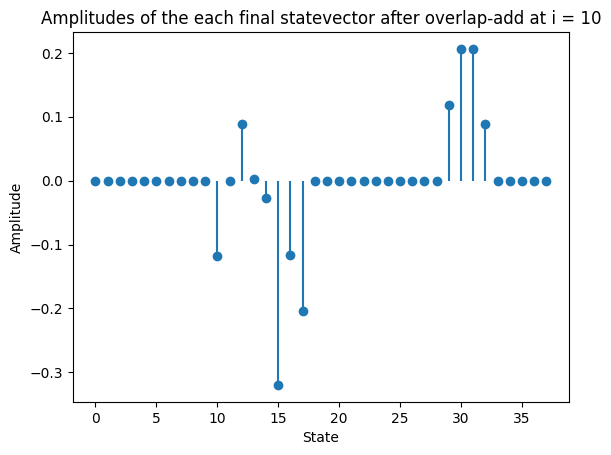


Final statevector after overlap-add: [ 0.00000000e+00+0.j  0.00000000e+00+0.j  0.00000000e+00+0.j
  0.00000000e+00+0.j  0.00000000e+00+0.j  0.00000000e+00+0.j
  0.00000000e+00+0.j  0.00000000e+00+0.j  0.00000000e+00+0.j
  3.39934989e-17+0.j -1.17851130e-01+0.j -2.48123922e-17+0.j
  8.83883476e-02+0.j  2.11533261e-03+0.j -2.73474499e-02+0.j
 -3.19859943e-01+0.j -1.15735798e-01+0.j -2.04124145e-01+0.j
 -1.90201611e-17+0.j -5.21652986e-17+0.j -4.16333634e-17+0.j
 -2.77555756e-17+0.j  3.12250226e-17+0.j  0.00000000e+00+0.j
  0.00000000e+00+0.j  0.00000000e+00+0.j  0.00000000e+00+0.j
  3.20493781e-17+0.j -4.69352276e-18+0.j  1.17851130e-01+0.j
  2.06239478e-01+0.j  2.06239478e-01+0.j  8.83883476e-02+0.j
  2.95455204e-17+0.j  1.20185168e-17+0.j  1.80277752e-17+0.j
  1.20185168e-17+0.j -1.35208314e-17+0.j]

filter scaling 0.5773502691896257



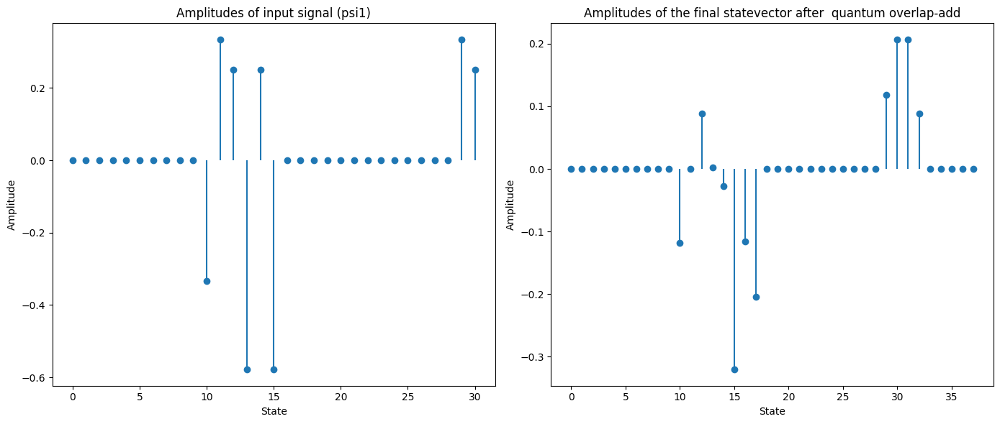

In [58]:
# Define the coefficients for the two initial states (works with complex numbers)
# coeffs_psi1 = [1/3, 1/4, np.sqrt(3)/3, 5/12, np.sqrt(2)/6, 5/12, np.sqrt(13)/12, 1/3, 1/4, 1/2]  # Input signal
coeffs_psi1 = [0,0,0,0,0,0,0,0,0,0,-1/3, 1/3, 1/4, -np.sqrt(3)/3,1/4, -np.sqrt(3)/3, 0, 0, 0, 0,0,0,0,0,0,0,0,0,0, 1/3,1/4]    #testing for windowed state with zeroes. we would be actively ignoring these from quantum state preparation
coeffs_psi2 = [1, 1, 1]  # Window specifications

# Plot the amplitudes of psi1
plot_amplitudes(coeffs_psi1, f"Amplitudes of input signal (psi1)")
print()

# Define the length of the averaging filter
N = len(coeffs_psi2)  # Use the length of the window as the length of the averaging filter

# Define the translation parameter
m = len(coeffs_psi2)  # Set m to the window length to ensure non-overlapping windows

# List to store the final statevectors
# statevectors = []   # This is uncommented in case we need to observe every statevector together. Keep in mind this is memory exhaustive. Overlap add loop doesnt need it anymore.

 ################### FILTER ################################

# Generate the averaging filter
filter_vector = averaging_filter(N)
print("Averaging filter:", filter_vector)
print()

# Normalize the averaging filter
normalized_filter_vector,filter_scaling = normalize(filter_vector)
# filter_scaling = np.linalg.norm(filter_vector)
print("Normalized averaging filter:", normalized_filter_vector)
print()

# Pad the filter vector to the nearest power of 2 that is at least twice the length of N
target_length = 1 << ((2 * N - 1).bit_length())
padded_filter_vector = list(normalized_filter_vector) + [0] * (target_length - len(normalized_filter_vector))
print("Padded averaging filter:", padded_filter_vector)
print()

##############  LOOP  ##########################

# Initialize the final output statevector for overlap-add
final_statevector_length = len(coeffs_psi1) + len(padded_filter_vector) - 1
final_statevector = np.zeros(final_statevector_length, dtype=complex)

# Loop through the entire length of the input signal with non-overlapping windows
for start_index in range(0, len(coeffs_psi1), m):
    if start_index + len(coeffs_psi2) > len(coeffs_psi1):
        # If the remaining part of the input signal is less than the window length, pad it with zeros
        current_window = coeffs_psi1[start_index:] + [0] * (len(coeffs_psi2) - (len(coeffs_psi1) - start_index))
    else:
        current_window = coeffs_psi1[start_index:start_index + len(coeffs_psi2)]

    # Check if the current window is all zeroes
    if np.all(np.array(current_window) == 0):
        print(f"Window at index {start_index} is all zeroes. Skipping quantum circuit creation.")
        print()
        continue

    # Perform element-wise multiplication and normalization starting at index m
    normalized_result_coeffs, scaling = elementwise_multiply_and_normalize(current_window, coeffs_psi2, 0)

    # Pad the resulting vector to the closest power of two
    padded_result_coeffs = pad_to_power_of_two(normalized_result_coeffs)

    # print(padded_result_coeffs)
    print("Start index at = ", start_index)
    print()

    ################### FILTER ################################

    # Define the quantum circuit
    num_qubits = int(np.log2(len(padded_result_coeffs)))
    qc = QuantumCircuit(num_qubits * 2, num_qubits * 2)

    qc.initialize(padded_result_coeffs, range(num_qubits))
    qc.initialize(padded_filter_vector, range(num_qubits, 2 * num_qubits))

    # Append QFT to the circuit
    qc.append(QFT(num_qubits), range(num_qubits))  # QFT on first register
    qc.append(QFT(num_qubits), range(num_qubits, 2 * num_qubits))  # QFT on second register

    # Apply CNOT gates from register 1 to register 2
    for i in range(num_qubits):
        qc.cx(i, num_qubits + i)

    # Apply the inverse QFT to the first register after element-wise multiplication
    qc.append(QFT(num_qubits, inverse=True).to_gate(), range(num_qubits))

    # Add instructions to save the statevector
    qc.save_statevector()

    # Draw the quantum circuit
    qc.draw(output='mpl')
    # plt.show()

    # Simulate the quantum circuit
    simulator = Aer.get_backend('aer_simulator')
    compiled_circuit = transpile(qc, simulator)
    result = simulator.run(compiled_circuit).result()

    # Get the statevector of the quantum circuit
    statevector = result.get_statevector()

    # Extract the resulting state
    resulting_state = Statevector(statevector).data[:2**num_qubits]

    final_resulting_state = (resulting_state * scaling)/ filter_scaling

    print("final Resulting statevector:", final_resulting_state)
    print()

    # Perform overlap-add
    overlap_start_index = start_index
    final_statevector[overlap_start_index:overlap_start_index + len(final_resulting_state)] += np.real(final_resulting_state)

    plot_amplitudes_side_by_side(
        padded_result_coeffs,
        final_resulting_state,
        f"Amplitudes of the windowed input signal state (after padding) at m = {m}",
        f"Amplitudes of the Resulting convolution State at m = {m}"
    )

    plot_amplitudes(final_statevector, f"Amplitudes of the each final statevector after overlap-add at i = {start_index // m}")
    print()

# Print the final statevector after overlap-add
print("Final statevector after overlap-add:", final_statevector)
print()
print("filter scaling", filter_scaling)
print()
# Plot the amplitudes of the final statevector
# plot_amplitudes(final_statevector, "Amplitudes of the final statevector after overlap-add")
plot_amplitudes_side_by_side(
    coeffs_psi1,
    final_statevector,
    f"Amplitudes of input signal (psi1)",
    f"Amplitudes of the final statevector after  quantum overlap-add"
)
print()


In [20]:
# Define the coefficients for the two initial states (works with complex numbers)
# coeffs_psi1 = [1/3, 1/4, np.sqrt(3)/3, 5/12, np.sqrt(2)/6, 5/12, np.sqrt(13)/12, 1/3, 1/4, 1/2]  # Input signal
coeffs_psi1 = [0,0,0,0,0,0,0,0,0,0,-1/3, 1/3, 1/4, -np.sqrt(3)/3,1/4, -np.sqrt(3)/3, 0, 0, 0, 0,0,0,0,0,0,0,0,0,0, 1/3,1/4]    #testing for windowed state with zeroes. we would be actively ignoring these from quantum state preparation
coeffs_psi2 = [1, 1, 1]  # Window specifications

# Plot the amplitudes of psi1
# plot_amplitudes(coeffs_psi1, f"Amplitudes of input signal (psi1)")
# print()

# Define the length of the averaging filter
N = len(coeffs_psi2)  # Use the length of the window as the length of the averaging filter

# Define the translation parameter
m = len(coeffs_psi2)  # Set m to the window length to ensure non-overlapping windows

# List to store the final statevectors
# statevectors = []   # This is uncommented in case we need to observe every statevector together. Keep in mind this is memory exhaustive. Overlap add loop doesnt need it anymore.

 ################### FILTER ################################

# Generate the averaging filter
filter_vector = averaging_filter(N)
print("Averaging filter:", filter_vector)
print()

# Normalize the averaging filter
normalized_filter_vector = normalize(filter_vector)
filter_scaling = np.linalg.norm(filter_vector)
print("Normalized averaging filter:", normalized_filter_vector)
print()

# Pad the filter vector to the nearest power of 2 that is at least twice the length of N
target_length = 1 << ((2 * N - 1).bit_length())
padded_filter_vector = list(normalized_filter_vector) + [0] * (target_length - len(normalized_filter_vector))
print("Padded averaging filter:", padded_filter_vector)
print()

##############  LOOP  ##########################

# Initialize the final output statevector for overlap-add
final_statevector_length = len(coeffs_psi1) + len(padded_filter_vector) - 1
final_statevector = np.zeros(final_statevector_length, dtype=complex)

# Loop through the entire length of the input signal with non-overlapping windows
for start_index in range(0, len(coeffs_psi1), m):
    if start_index + len(coeffs_psi2) > len(coeffs_psi1):
        # If the remaining part of the input signal is less than the window length, pad it with zeros
        current_window = coeffs_psi1[start_index:] + [0] * (len(coeffs_psi2) - (len(coeffs_psi1) - start_index))
    else:
        current_window = coeffs_psi1[start_index:start_index + len(coeffs_psi2)]

    # Check if the current window is all zeroes
    if np.all(np.array(current_window) == 0):
        print(f"Window at index {start_index} is all zeroes. Skipping quantum circuit creation.")
        print()
        continue

    # Perform element-wise multiplication and normalization starting at index m
    normalized_result_coeffs, scaling = elementwise_multiply_and_normalize(current_window, coeffs_psi2, 0)

    # Pad the resulting vector to the closest power of two
    padded_result_coeffs = pad_to_power_of_two(normalized_result_coeffs)

    # print(padded_result_coeffs)
    # print("Start index at = ", start_index)
    # print()

    ################### FILTER ################################

    # Define the quantum circuit
    num_qubits = int(np.log2(len(padded_result_coeffs)))
    qc = QuantumCircuit(num_qubits * 2, num_qubits * 2)

    qc.initialize(padded_result_coeffs, range(num_qubits))
    qc.initialize(padded_filter_vector, range(num_qubits, 2 * num_qubits))

    # Append QFT to the circuit
    qc.append(QFT(num_qubits), range(num_qubits))  # QFT on first register
    qc.append(QFT(num_qubits), range(num_qubits, 2 * num_qubits))  # QFT on second register

    # Apply CNOT gates from register 1 to register 2
    for i in range(num_qubits):
        qc.cx(i, num_qubits + i)

    # Apply the inverse QFT to the first register after element-wise multiplication
    qc.append(QFT(num_qubits, inverse=True).to_gate(), range(num_qubits))

    # Add instructions to save the statevector
    qc.save_statevector()

    # Draw the quantum circuit
    qc.draw(output='mpl')
    # plt.show()

    # Simulate the quantum circuit
    simulator = Aer.get_backend('aer_simulator')
    compiled_circuit = transpile(qc, simulator)
    result = simulator.run(compiled_circuit).result()

    # Get the statevector of the quantum circuit
    statevector = result.get_statevector()

    # Extract the resulting state
    resulting_state = Statevector(statevector).data[:2**num_qubits]

    final_resulting_state = (resulting_state * scaling)/ filter_scaling

    print("final Resulting statevector:", final_resulting_state)
    print()

    # Perform overlap-add
    overlap_start_index = start_index
    final_statevector[overlap_start_index:overlap_start_index + len(final_resulting_state)] += np.real(final_resulting_state)

    # plot_amplitudes_side_by_side(
    #     padded_result_coeffs,
    #     final_resulting_state,
    #     f"Amplitudes of the windowed input signal state (after padding) at m = {m}",
    #     f"Amplitudes of the Resulting convolution State at m = {m}"
    # )

    # plot_amplitudes(final_statevector, f"Amplitudes of the each final statevector after overlap-add at i = {start_index // m}")
    print()

# Print the final statevector after overlap-add
print("Final statevector after overlap-add:", final_statevector)
print()
# print("filter scaling", filter_scaling)
print()
# Plot the amplitudes of the final statevector
# plot_amplitudes(final_statevector, "Amplitudes of the final statevector after overlap-add")

# plot_amplitudes_side_by_side(
#     coeffs_psi1,
#     final_statevector,
#     f"Amplitudes of input signal (psi1)",
#     f"Amplitudes of the final statevector after  quantum overlap-add"
# )

traces = [] 
traces.append(go.Scatter(y=coeffs_psi1, name="Amplitudes of input signal (psi1)"))
# Had to use np.real(final_statevector) to make the next line plot rendering to work 
traces.append(go.Scatter(y=np.real(final_statevector), name="Amplitudes of the final statevector after  quantum overlap-add")) 
fig = go.Figure(traces)
fig.show()


print()


Averaging filter: [0.33333333 0.33333333 0.33333333]

Normalized averaging filter: [0.57735027 0.57735027 0.57735027]

Padded averaging filter: [0.5773502691896257, 0.5773502691896257, 0.5773502691896257, 0, 0, 0, 0, 0]

Window at index 0 is all zeroes. Skipping quantum circuit creation.

Window at index 3 is all zeroes. Skipping quantum circuit creation.

Window at index 6 is all zeroes. Skipping quantum circuit creation.

final Resulting statevector: [ 3.39934989e-17-5.66558315e-18j -1.17851130e-01+6.52828036e-17j
 -2.48123922e-17+2.42337353e-17j -1.29905772e-17-2.29156904e-17j
  1.17851130e-01-5.56424003e-17j -1.13311663e-17-1.32485535e-17j
 -2.32616749e-17+8.20904626e-18j  2.10029217e-17-2.53357796e-19j]


final Resulting statevector: [ 8.83883476e-02-2.65256351e-17j -1.15735798e-01+4.89446517e-17j
 -2.73474499e-02+4.61702923e-17j -1.15735798e-01+1.18678355e-17j
  8.83883476e-02-3.80324888e-17j -2.44097230e-17+2.50542967e-19j
  1.22048615e-17+1.76257527e-18j -2.44097230e-17+4.78106

In [136]:
import numpy as np
import plotly.graph_objects as go

def build_windowed_sinc(N, fc):
    # https://www.dspguide.com/CH16.PDF
    # fc is on the range of 0 -> 0.5 (i.e. on the qyquist range) 
    h = np.zeros(N)
    for i in range(N):
        if i == N//2:
            h[i] = 2*np.pi*fc
        else:
            h[i] = np.sin(2*np.pi*fc*(i-N//2)) / (i - N//2)
    h *= np.hamming(N)
    h /= h.sum()
    return h

T = 0.2 # seconds of data 
fs = 1000 # sampling rate per second
t = np.linspace(0, T, int(T*fs))

fa = np.array([10 , 250]) # signals we are going to sample

# check nyquist is happy 
assert((fa<fs/2).all())

# create signal 
x = np.zeros_like(t)
for f in fa:
    x += np.sin(f*2*np.pi*t)

# simple low pass filter 
N = 20 # Filter lenght  originally 11
h2 = np.ones(N) / N  # also known as a boxcar filter or averaging filter

fc = np.mean(fa/fs) # make this in the middle of our two signals
h = build_windowed_sinc(N, fc)

y = np.convolve(x, h)

# bens plotting code below 

traces = [] 
traces.append(go.Scatter(y=h, name="filter"))
fig = go.Figure(traces)
fig.show()

H = np.abs(np.fft.fft(h))
H = np.fft.fftshift(H)

H2 = np.abs(np.fft.fft(h2))
H2 = np.fft.fftshift(H2)

traces = [] 
traces.append(go.Scatter(x=np.fft.fftshift(np.fft.fftfreq(N)), y=10*np.log10(H2**2 + 1e-12), name="Boxcar Response"))
traces.append(go.Scatter(x=np.fft.fftshift(np.fft.fftfreq(N)), y=10*np.log10(H**2 + 1e-12), name="Windowed Sinc"))
fig = go.Figure(traces)
fig.update_xaxes(title="Frequency [0->0.5 sample rate]")
fig.update_yaxes(title="Amplitude Response [dB]")
fig.show()

traces = [] 
traces.append(go.Scatter(y=x, name="input signal"))
traces.append(go.Scatter(y=y, name="filtered result"))
fig = go.Figure(traces)
fig.show()

pass

In [140]:
def build_windowed_sinc(N, fc):
    # https://www.dspguide.com/CH16.PDF
    # fc is on the range of 0 -> 0.5 (i.e. on the qyquist range) 
    h = np.zeros(N)
    for i in range(N):
        if i == N//2:
            h[i] = 2*np.pi*fc
        else:
            h[i] = np.sin(2*np.pi*fc*(i-N//2)) / (i - N//2)
    h *= np.hamming(N)
    h /= h.sum()
    return h

T = 0.2 # seconds of data 
fs = 1000 # sampling rate per second
t = np.linspace(0, T, int(T*fs))

fa = np.array([10 , 250]) # signals we are going to sample

# check nyquist is happy 
assert((fa<fs/2).all())

# create signal 
x = np.zeros_like(t)
for f in fa:
    x += np.sin(f*2*np.pi*t)

# simple low pass filter 
N = 7 # Filter lenght  originally 11, works only for factors of sampling rate ue to a bug. will fix it soon
h2 = np.ones(N) / N  # also known as a boxcar filter or averaging filter

fc = np.mean(fa/fs) # make this in the middle of our two signals
h = build_windowed_sinc(N, fc)

################## QUANTUM OVERLAP ADD #############################


# Define the coefficients for the two initial states (works with complex numbers)
# coeffs_psi1 = [1/3, 1/4, np.sqrt(3)/3, 5/12, np.sqrt(2)/6, 5/12, np.sqrt(13)/12, 1/3, 1/4, 1/2]  # Input signal
coeffs_psi1 =  x
# coeffs_psi1 = [0,0,0,0,0,0,0,0,0,0,-1/3, 1/3, 1/4, -np.sqrt(3)/3,1/4, -np.sqrt(3)/3, 0, 0, 0, 0,0,0,0,0,0,0,0,0,0, 1/3,1/4]    #testing for windowed state with zeroes. we would be actively ignoring these from quantum state preparation
# coeffs_psi2 = [1, 1, 1]  # Window specifications
coeffs_psi2 = np.ones(N)
# coeffs_psi2 = np.ones(5)   # for some reason no error pops up for window lenght 5 and multiples of 5. see why this is..????
# coeffs_psi2 = np.ones(10)
filter_vector = h
# Plot the amplitudes of psi1
# plot_amplitudes(coeffs_psi1, f"Amplitudes of input signal (psi1)")
# print()

# Define the length of the averaging filter
# N = len(coeffs_psi2)+4  # Use the length of the window as the length of the averaging filter
N = 10
# Define the translation parameter
# m = len(coeffs_psi2) + 4 # Set m to the window length to ensure non-overlapping windows
m = N
# List to store the final statevectors
# statevectors = []   # This is uncommented in case we need to observe every statevector together. Keep in mind this is memory exhaustive. Overlap add loop doesnt need it anymore.

 ################### FILTER ################################

# filter_vector = h2
print("Filter:", filter_vector)
print()

# Generate the averaging filter
# filter_vector = averaging_filter(N)
# print("Averaging filter:", filter_vector)
# print()

# Normalize the averaging filter
normalized_filter_vector, filter_scaling = normalize(filter_vector)
# filter_scaling = np.linalg.norm(filter_vector)
print("L2 Normalized filter:", normalized_filter_vector)
print()

# Pad the filter vector to the nearest power of 2 that is at least twice the length of N
# target_length = 1 << ((2 * N - 1).bit_length())
target_length = 1 << (( N + len(coeffs_psi2) - 1).bit_length())
padded_filter_vector = list(normalized_filter_vector) + [0] * (target_length - len(normalized_filter_vector))
# padded_filter_vector = list(normalized_filter_vector) + [0] * (target_length - len(normalized_filter_vector))
print("target length:", target_length)
print("Padded filter:", padded_filter_vector)
print()

##############  LOOP  ##########################

# Initialize the final output statevector for overlap-add
final_statevector_length = len(coeffs_psi1) + len(padded_filter_vector) - 1
final_statevector = np.zeros(final_statevector_length, dtype=complex)

# Loop through the entire length of the input signal with non-overlapping windows
for start_index in range(0, len(coeffs_psi1), m):
    if start_index + len(coeffs_psi2) > len(coeffs_psi1):
        # If the remaining part of the input signal is less than the window length, pad it with zeros
        # current_window = coeffs_psi1[start_index:] + [0] * (len(coeffs_psi2) - (len(coeffs_psi1) - start_index))
        ###  In following modification is made to pad the last segment iwith zeroes of the size of the window. Earlier line was trying to pad wiht the remaning values intact. Here we discard em. This is to workaround the error from before restricting us to only window lenghts which were factors of the total signal lenght
        current_window = [0] * (len(coeffs_psi2))
    else:
        current_window = coeffs_psi1[start_index:start_index + len(coeffs_psi2)]
    # current_window = coeffs_psi1[start_index:start_index + len(coeffs_psi2)]

    # Check if the current window is all zeroes
    if np.all(np.array(current_window) == 0):
        print(f"Window at index {start_index} is all zeroes. Skipping quantum circuit creation.")
        print()
        continue
    # Pad the resulting vector to the closest power of two
    # padded_current_window = pad_to_power_of_two(current_window,N,len(coeffs_psi2))
    # padded_coeff_psi2 = pad_to_power_of_two(coeffs_psi2,N,len(coeffs_psi2))

    padded_current_window= list(current_window) + [0] * (target_length  - len(normalized_filter_vector))
    padded_coeff_psi2 = list(coeffs_psi2) + [0] * (target_length -  len(normalized_filter_vector))


    # Perform element-wise multiplication and normalization starting at index m
    normalized_result_coeffs, window_scaling = elementwise_multiply_and_normalize(padded_current_window, padded_coeff_psi2, 0)
    # normalized_result_coeffs, window_scaling = elementwise_multiply_and_normalize(current_window, coeff_psi2, 0)

    padded_result_coeffs = normalized_result_coeffs
    print(len(padded_result_coeffs))

    # padded_result_coeffs = pad_to_power_of_two(normalized_result_coeffs,N,m)
    # print(padded_result_coeffs)
    # print("Start index at = ", start_index)
    # print()

    ################### FILTER ################################

    # Define the quantum circuit
    num_qubits = int(np.log2(len(padded_result_coeffs)))
    qc = QuantumCircuit(num_qubits * 2, num_qubits * 2)

    qc.initialize(padded_result_coeffs, range(num_qubits))
    qc.initialize(padded_filter_vector, range(num_qubits, 2 * num_qubits))

    # Append QFT to the circuit
    qc.append(QFT(num_qubits), range(num_qubits))  # QFT on first register
    qc.append(QFT(num_qubits), range(num_qubits, 2 * num_qubits))  # QFT on second register

    # Apply CNOT gates from register 1 to register 2
    for i in range(num_qubits):
        qc.cx(i, num_qubits + i)

    # Apply the inverse QFT to the first register after element-wise multiplication
    qc.append(QFT(num_qubits, inverse=True).to_gate(), range(num_qubits))

    # Add instructions to save the statevector
    qc.save_statevector()

    # Draw the quantum circuit
    qc.draw(output='mpl')
    # plt.show()

    # Simulate the quantum circuit
    simulator = Aer.get_backend('aer_simulator')
    compiled_circuit = transpile(qc, simulator)
    result = simulator.run(compiled_circuit).result()

    # Get the statevector of the quantum circuit
    statevector = result.get_statevector()

    # Extract the resulting state
    resulting_state = Statevector(statevector).data[:2**num_qubits]

    final_resulting_state = resulting_state * window_scaling / filter_scaling

    print("final Resulting statevector:", final_resulting_state)
    print()

    # Perform overlap-add
    overlap_start_index = start_index
    final_statevector[overlap_start_index:overlap_start_index + len(final_resulting_state)] += np.real(final_resulting_state)

    # plot_amplitudes_side_by_side(
    #     padded_result_coeffs,
    #     final_resulting_state,
    #     f"Amplitudes of the windowed input signal state (after padding) at m = {m}",
    #     f"Amplitudes of the Resulting convolution State at m = {m}"
    # )

    # plot_amplitudes(final_statevector, f"Amplitudes of the each final statevector after overlap-add at i = {start_index // m}")
    # print()

# Print the final statevector after overlap-add
print("Final statevector after overlap-add:", final_statevector)
print()
# print("filter scaling", filter_scaling)
print()
# Plot the amplitudes of the final statevector
# plot_amplitudes(final_statevector, "Amplitudes of the final statevector after overlap-add")

# plot_amplitudes_side_by_side(
#     coeffs_psi1,
#     final_statevector,
#     f"Amplitudes of input signal (psi1)",
#     f"Amplitudes of the final statevector after  quantum overlap-add"
# )

traces = [] 
traces.append(go.Scatter(y=coeffs_psi1, name="input signal (psi1)"))
# Had to use np.real(final_statevector) to make the next line plot rendering to work 
traces.append(go.Scatter(y=np.real(final_statevector), name="quantum overlap-add")) 
fig = go.Figure(traces)
fig.update_layout(title=f"quantum overlap add with filter lenght = {len(filter_vector)} and window lenght = {N}")
fig.show()


y = np.convolve(x, filter_vector)

traces = [] 
traces.append(go.Scatter(y=x, name="input signal"))
traces.append(go.Scatter(y=y, name="numpy filtered result"))
fig = go.Figure(traces)
fig.update_layout(title=f"numpy overlap add with filter lenght = {len(filter_vector)} and window lenght = {N}")
fig.show()

traces = [] 
traces.append(go.Scatter(y=np.real(final_statevector), name="quantum overlap add"))
traces.append(go.Scatter(y=y, name="numpy overlap add"))
fig = go.Figure(traces)
fig.update_layout(title=f"quantum vs numpy overlap add with filter lenght = {len(filter_vector)} and window lenght = {N}")
fig.show()

print()


Filter: [0.00744607 0.06776479 0.24588373 0.35781081 0.24588373 0.06776479
 0.00744607]

L2 Normalized filter: [0.0146526  0.13334948 0.48385699 0.70411026 0.48385699 0.13334948
 0.0146526 ]

target length: 32
Padded filter: [0.014652596541247821, 0.13334947968825706, 0.48385698850015896, 0.7041102646049517, 0.48385698850015896, 0.13334947968825706, 0.014652596541247821, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

32
final Resulting statevector: [-3.26227423e-17+1.93314729e-16j  5.41864273e-03+1.01231309e-16j
  4.98752316e-02-2.89787257e-17j  1.79908870e-01-8.26562440e-17j
  2.42724844e-01-1.39656798e-16j  8.90785714e-02+2.22800846e-18j
 -2.11071702e-02+3.83640239e-17j  1.78314247e-01-2.27405040e-16j
  3.85392449e-01-4.36907117e-16j  3.08375746e-01-2.36773773e-16j
  1.16480156e-01-8.65271032e-17j  2.16379486e-02-5.08225464e-17j
  1.64404423e-03-1.29973648e-17j  1.00070139e-17+4.28841932e-17j
  3.80258583e-17+3.97865420e-17j  4.15454966e-17+3.67629355e-19

In [147]:
traces = [] 
traces.append(go.Scatter(y=coeffs_psi1, name="input signal (psi1)"))
# Had to use np.real(final_statevector) to make the next line plot rendering to work 
traces.append(go.Scatter(y=np.real(final_statevector), name="quantum overlap-add")) 
fig = go.Figure(traces)
fig.update_layout(title=f"quantum overlap add with N = {N}")
fig.show()

traces = [] 
traces.append(go.Scatter(y=x, name="input signal"))
traces.append(go.Scatter(y=y, name="numpy filtered result"))
fig = go.Figure(traces)
fig.update_layout(title=f"numpy overlap add with N = {N}")
fig.show()

traces = [] 
traces.append(go.Scatter(y=np.real(final_statevector), name="quantum overlap add"))
traces.append(go.Scatter(y=y, name="numpy overlap add"))
fig = go.Figure(traces)
fig.update_layout(title=f"quantum vs numpy overlap add with N = {N}")
fig.show()

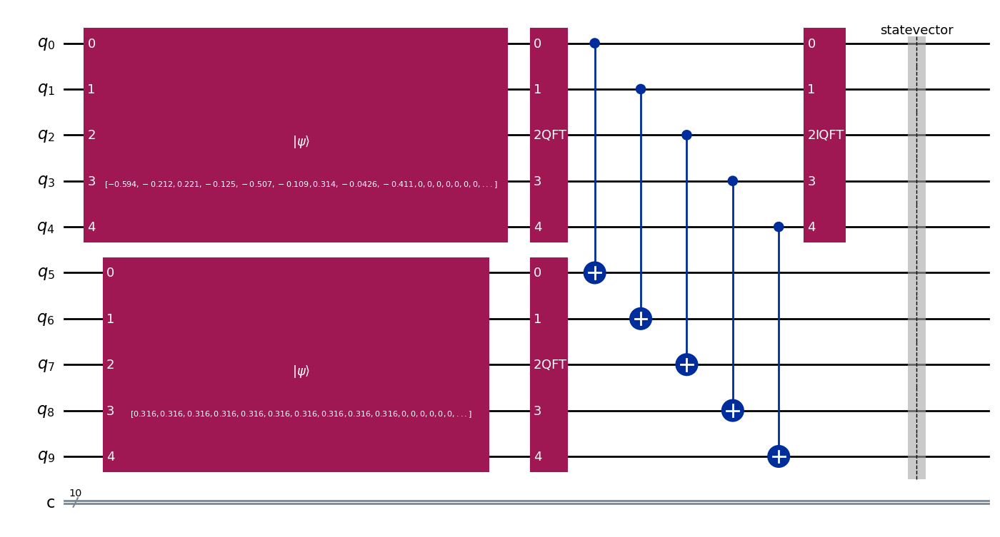

In [84]:
qc.draw('mpl')

In [68]:
traces = [] 
traces.append(go.Scatter(y=coeffs_psi1, name="Amplitudes of input signal (psi1)"))
# Had to use np.real(final_statevector) to make the next line plot rendering to work 
traces.append(go.Scatter(y=np.real(final_statevector), name="Amplitudes of the final statevector after  quantum overlap-add")) 
fig = go.Figure(traces)
fig.show()


[0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0.]


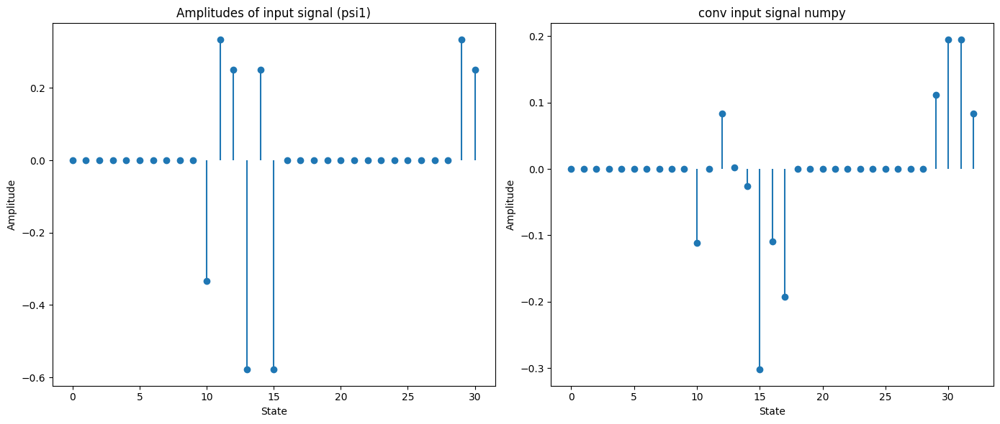

In [11]:
import numpy as np
x = [0,0,0,0,0,0,0,0,0,0,1/3, 1/4, np.sqrt(3)/3, 0, 0, 0, 0,0,0,0,0,0,0,0,0,0, 1/3,1/4]
x = np.zeros(shape=(20))
x[7:14] = 1
numpy_conv = np.convolve(coeffs_psi1, filter_vector, mode='full')
numpy_conv

print(x)
# print(normalized_resulting_state)

plot_amplitudes_side_by_side(
    coeffs_psi1,
    numpy_conv,
    f"Amplitudes of input signal (psi1)",
    f"conv input signal numpy"
)
# Plot the amplitudes of psi1
# plot_amplitudes(numpy_conv, f"Amplitudes of conv input signal numpy (psi1)")
print()
# plot_amplitudes(normalized_numpy_conv, f"Amplitudes of normalized conv input signal numpy (psi1)")

# Numpy conv

[0.11111111 0.19444444 0.38689453 0.41467231 0.4099064  0.3563452
 0.31761051 0.3501542  0.29459865 0.36111111 0.25       0.16666667]


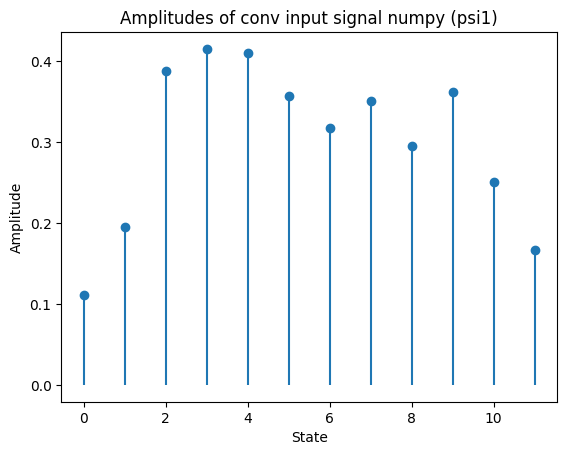

In [12]:
import numpy as np
numpy_conv = np.convolve([1/3, 1/4, np.sqrt(3)/3, 5/12, np.sqrt(2)/6, 5/12, np.sqrt(13)/12, 1/3,1/4,1/2], filter_vector, mode='full')
numpy_conv

print(numpy_conv)
# print(normalized_resulting_state)


# Plot the amplitudes of psi1
plot_amplitudes(numpy_conv, f"Amplitudes of conv input signal numpy (psi1)")
print()
# plot_amplitudes(normalized_numpy_conv, f"Amplitudes of normalized conv input signal numpy (psi1)")

# Comparison b/w numpy conv and quantum conv

In [151]:
# Define the two arrays
real_array = y
# real_array = numpy_conv
complex_array = final_statevector

scale = real_array/complex_array[:len(real_array)]

print("scale",scale)

# print(normalized_numpy_conv)
# print()
# print(normalized_final_statevector)
# print()
# Step 1: Check the shape
if real_array.shape != complex_array.shape:
    print(f"Shapes are different: {real_array.shape} vs {complex_array.shape}")
else:
    print(f"Shapes are the same: {real_array.shape}")

# Step 2: Complex to Real Conversion
real_part_of_complex_array = np.real(complex_array)

# Step 3: Magnitude Comparison
magnitude_of_complex_array = np.abs(complex_array)

# Step 4: Element-wise Comparison
elementwise_difference = real_array - real_part_of_complex_array[:len(real_array)]

# Print element-wise comparison results
print("Element-wise differences (real part):")
print(elementwise_difference)
print()

# Print magnitude comparison results
print("Real array:")
print(real_array)
print()
print("Magnitude of complex array:")
print(magnitude_of_complex_array[:len(real_array)])
print()

# Summarize differences
mean_difference = np.mean(elementwise_difference)
max_difference = np.max(np.abs(elementwise_difference))

print(f"Mean difference: {mean_difference}")
print()
print(f"Max difference: {max_difference}")
print()

scale [ 0.        +0.j  0.94813063-0.j  0.94813063+0.j  0.94813063+0.j
  0.94813063+0.j  0.94813063+0.j  0.94813063+0.j  0.94813063+0.j
  0.94813063+0.j  0.94813063+0.j  0.94813063+0.j  0.94813063+0.j
  0.94813063+0.j  0.94813063+0.j  0.94813063+0.j  0.94813063+0.j
  0.94813063+0.j  0.94813063+0.j  0.94813063+0.j  0.94813063+0.j
  0.94813063+0.j  0.94813063+0.j  0.94813063+0.j  0.94813063+0.j
  0.94813063+0.j  0.94813063+0.j  0.94813063+0.j  0.94813063+0.j
  0.94813063+0.j  0.94813063+0.j  0.94813063+0.j  0.94813063+0.j
  0.94813063+0.j  0.94813063+0.j  0.94813063+0.j  0.94813063+0.j
  0.94813063+0.j  0.94813063+0.j  0.94813063+0.j  0.94813063+0.j
  0.94813063+0.j  0.94813063+0.j  0.94813063+0.j  0.94813063+0.j
  0.94813063+0.j  0.94813063+0.j  0.94813063+0.j  0.94813063+0.j
  0.94813063+0.j  0.94813063+0.j  0.94813063+0.j  0.94813063+0.j
  0.94813063+0.j  0.94813063+0.j  0.94813063-0.j  0.94813063-0.j
  0.94813063-0.j  0.94813063-0.j  0.94813063-0.j  0.94813063-0.j
  0.94813063-0.j  0

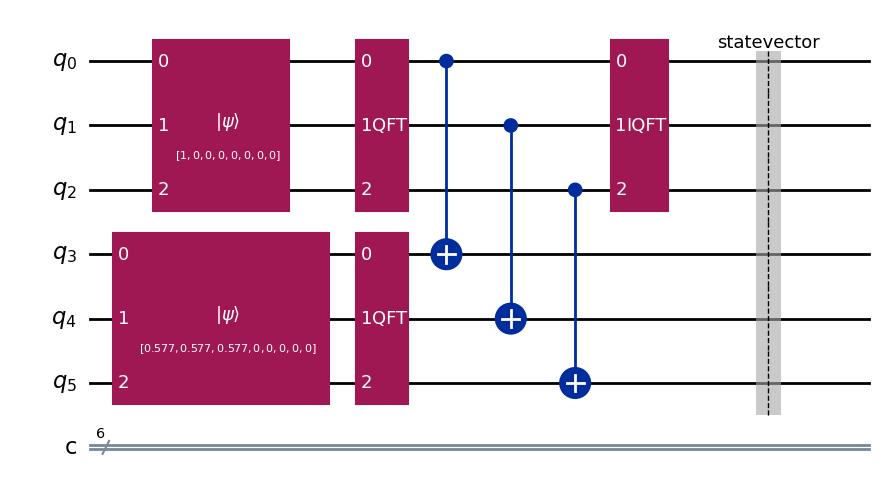

In [15]:
# Draw the quantum circuit
qc.draw(output='mpl')
# plt.show()

|  1.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j-0.000, -0.00 +j-0.000, -0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000, -0.00 +j-0.000,  0.00 +j 0.000,  0.00 +j 0.000 |
|  0.00 +j 0.000,  0.68 +j-0.685,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000, -0.03 +j 0.018, -0.03 +j-0.031,  0.03 +j 0.034,  0.03 +j-0.065,  0.04 +j-0.083,  0.00 +j 0.196, -0.01 +j-0.009, -0.02 +j-0.061 |
|  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j-0.892,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000, -0.11 +j-0.172,  0.09 +j-0.048, -0.01 +j-0.083, -0.01 +j-0.025, -0.08 +j-0.017,  0.01 +j 0.036,  0.01 +j 0.355,  0.08 +j-0.045 |
|  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000, -0.58 +j-0.577,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000, -0.20 +j-0.120,  0.20 +j 0.002, -0.05 +j 0.030, -0.04 +j 0.090, -0.22 +j 0.004,  0.08 +j 0.145, -0.02 +j-0.273,  0.25 +j 0.122 |
|  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000, -0.78 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000, -0.31 +j-0.105, -0.12 +j-0.127,  0.34 +j-0.022,  0.07 +j 0.070,  0.16 +j 0.010,  0.03 +j-0.077, -0.04 +j-0.018, -0.13 +j 0.269 |
|  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000, -0.58 +j 0.577,  0.00 +j 0.000,  0.00 +j 0.000,  0.15 +j-0.154, -0.31 +j-0.010,  0.15 +j-0.187, -0.07 +j 0.184, -0.09 +j 0.182, -0.02 +j 0.145,  0.06 +j-0.047,  0.12 +j-0.113 |
|  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.892,  0.00 +j 0.000, -0.02 +j-0.056, -0.06 +j 0.077,  0.01 +j 0.039, -0.07 +j-0.347,  0.04 +j 0.224,  0.00 +j 0.008,  0.00 +j-0.017,  0.09 +j 0.072 |
|  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.68 +j 0.685, -0.02 +j 0.049,  0.11 +j 0.065,  0.12 +j-0.070, -0.00 +j-0.023, -0.07 +j 0.045, -0.07 +j 0.017,  0.01 +j-0.021, -0.08 +j-0.063 |
| -0.00 +j 0.000, -0.05 +j-0.005, -0.01 +j-0.103, -0.06 +j 0.146,  0.11 +j 0.095,  0.04 +j-0.149,  0.29 +j-0.099,  0.03 +j 0.002,  0.24 +j-0.316, -0.12 +j-0.014,  0.17 +j 0.053,  0.61 +j-0.193,  0.01 +j 0.076,  0.06 +j 0.086,  0.26 +j-0.310,  0.07 +j 0.147 |
| -0.00 +j 0.000, -0.08 +j 0.002, -0.14 +j-0.278,  0.09 +j-0.302, -0.08 +j-0.065,  0.03 +j 0.019,  0.03 +j 0.007,  0.05 +j 0.044,  0.22 +j 0.333, -0.34 +j-0.112, -0.13 +j 0.240,  0.15 +j 0.001,  0.25 +j 0.005, -0.14 +j 0.023, -0.47 +j-0.282,  0.05 +j-0.115 |
|  0.00 +j 0.000, -0.10 +j 0.019, -0.00 +j 0.103,  0.04 +j 0.016, -0.41 +j 0.099, -0.02 +j-0.040,  0.01 +j 0.068, -0.07 +j 0.035,  0.21 +j-0.177,  0.30 +j-0.265, -0.31 +j-0.224,  0.08 +j-0.148, -0.02 +j-0.145, -0.15 +j 0.306,  0.01 +j-0.052,  0.03 +j-0.483 |
| -0.00 +j-0.000,  0.07 +j-0.015,  0.12 +j-0.120, -0.20 +j-0.006, -0.26 +j 0.068, -0.09 +j 0.283, -0.05 +j-0.148,  0.05 +j-0.003,  0.29 +j 0.185,  0.12 +j 0.104, -0.17 +j 0.306, -0.17 +j-0.385,  0.10 +j-0.063,  0.12 +j-0.361,  0.37 +j-0.060,  0.01 +j 0.024 |
|  0.00 +j-0.000, -0.03 +j 0.092, -0.01 +j 0.077,  0.10 +j-0.106,  0.20 +j-0.026,  0.14 +j 0.253, -0.08 +j 0.031, -0.01 +j 0.067,  0.07 +j 0.123,  0.19 +j-0.515,  0.36 +j 0.018,  0.01 +j-0.116,  0.28 +j-0.224,  0.36 +j 0.173,  0.02 +j 0.137,  0.22 +j 0.083 |
| -0.00 +j-0.000,  0.04 +j-0.002, -0.08 +j-0.072, -0.02 +j 0.081,  0.07 +j 0.056, -0.33 +j-0.132, -0.13 +j 0.212,  0.06 +j 0.043,  0.00 +j-0.218,  0.15 +j 0.160, -0.16 +j-0.047,  0.08 +j 0.345,  0.40 +j-0.383,  0.35 +j-0.230, -0.06 +j-0.201, -0.05 +j-0.040 |
| -0.00 +j 0.000, -0.12 +j 0.042,  0.06 +j-0.036, -0.26 +j 0.248,  0.08 +j-0.221, -0.00 +j 0.083, -0.04 +j 0.022,  0.03 +j 0.069, -0.15 +j 0.025, -0.26 +j-0.032, -0.23 +j-0.018, -0.11 +j-0.087,  0.22 +j-0.429, -0.34 +j 0.373,  0.18 +j-0.033, -0.04 +j 0.301 |
| -0.00 +j-0.000,  0.11 +j-0.022, -0.18 +j-0.030, -0.03 +j 0.114, -0.05 +j-0.058,  0.03 +j 0.068,  0.09 +j-0.027, -0.10 +j 0.149,  0.37 +j-0.029,  0.14 +j-0.156, -0.28 +j-0.352, -0.11 +j-0.020, -0.15 +j 0.124,  0.14 +j-0.047, -0.30 +j-0.036, -0.13 +j 0.572 |

In [1]:
import os
import random
import copy
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# requirements listed in bens-requirements.txt


mse_loss = nn.MSELoss()
l1_loss = nn.L1Loss()

def build_windowed_sinc(N, fc):
    # https://www.dspguide.com/CH16.PDF
    # fc is on the range of 0 -> 0.5 (i.e. on the qyquist range) 
    assert(fc<=0.5 and fc>=0)
    h = np.zeros(N)
    for i in range(N):
        if i == N//2:
            h[i] = 2*np.pi*fc
        else:
            h[i] = np.sin(2*np.pi*fc*(i-N//2)) / (i - N//2)
    h *= np.hamming(N)
    h /= h.sum()
    return h

def plot_filter(h):

    fig = make_subplots(rows=1, cols=2)

    H = np.abs(np.fft.fft(h))
    H = np.fft.fftshift(H)
 
    fig.add_trace(
        go.Scatter(y=h, name="Filter"),
        row=1, col=1
    )
    fig.add_trace(
        go.Scatter(x=np.fft.fftshift(np.fft.fftfreq(N)), y=10*np.log10(H**2 + 1e-12), name="Frequency Response"),
        row=1, col=2
    )
    fig.update_xaxes(title="Sample",row=1, col=1)
    fig.update_yaxes(title="Amplitude", row=1, col=1)
    fig.update_xaxes(title="Frequency [0->0.5 sample rate]",row=1, col=2)
    fig.update_yaxes(title="Amplitude Response [dB]", row=1, col=2)
    return fig


class PleaseBeUnitary(nn.Module):
    def __init__(self, h, target_qubits=None):
        super(PleaseBeUnitary, self).__init__()
        N = h.shape[0]
        extra_elements = (2**(np.ceil(np.log2(N))) - N).astype(int)
        if target_qubits is not None:
            extra_elements = target_qubits - N 
        M = N + extra_elements
        # diagonal filter
        self.H = torch.diag_embed(h).type(torch.complex64)
        # fodder to make a unitary matrix
        self.A = torch.nn.Parameter(torch.randn(N, extra_elements, dtype=torch.complex64))  # rows must sum to 0 to make elementwise product correct
        self.B = torch.nn.Parameter(torch.randn(extra_elements, N, dtype=torch.complex64)) # true fodder
        self.C = torch.nn.Parameter(torch.randn(extra_elements, extra_elements, dtype=torch.complex64)) # true fodder
    
    def build_gate(self):
        return torch.row_stack([torch.column_stack([self.H, self.A]),torch.column_stack([self.B, self.C])])
    
    def compute_residuals(self):
        return torch.sum(self.A, axis=1)
    
    def forward(self, x):
      W = self.build_gate()
      residuals = self.compute_residuals()
      return residuals, W
    
 

def mse_loss(output, target):
    return ((output - target).abs()**2).mean()

def unitary_loss_fn(W):
    # is the gate matrix 
    return mse_loss(torch.matmul(W, W.H), torch.eye(W.shape[0],dtype=torch.complex64)) # a better way to measure this distance

def residual_loss_fn(residuals):
    # is the gate matrix 
    return mse_loss(residuals, torch.zeros_like(residuals))


if __name__ == "__main__":
    # choose a filter
    if False:
        # simple boxcar
        N = 3
        h = torch.ones(N) / N
    else:
        # windowed sinc
        N = 7 # make it odd for simplicity
        h = torch.tensor(build_windowed_sinc(N, fc=0.2))

    fig = plot_filter(h)
    fig.show()

    H = torch.fft.fft(h)

    Nq = 20
    model = PleaseBeUnitary(H, target_qubits=Nq)
    model.train()
 
    eps = 1e-10
    lr = 1e-3
    beta1 = 0.9
    optimizer = optim.Adam(model.parameters(), lr=lr, betas=(beta1, 0.999), eps=eps)
    
    num_iterations = int(5e4)
    losses=np.zeros(shape=(num_iterations))
    correctness_losses=np.zeros(shape=(num_iterations))
    unitary_losses=np.zeros(shape=(num_iterations))
    
    # Hack until we make training stable
    min_loss = 1e9
    best_model = None
    for i in range(num_iterations):
        model.zero_grad()
        residuals, W = model(None)
        
        unitary_loss = unitary_loss_fn(W) 
        #unitary_loss = torch.norm(I_hat - torch.eye(I_hat.shape[0],dtype=torch.complex64))
        correctness_loss =  residual_loss_fn(residuals)

        err = 30*unitary_loss + correctness_loss
        err.backward()
        optimizer.step()
        
        losses[i] = err.item()
        correctness_losses[i] = correctness_loss.item()
        unitary_losses[i] = unitary_loss.item()

        if losses[i] < min_loss:
            min_loss = losses[i] 
            best_model = copy.deepcopy(model)

        if i % (num_iterations//10) == 0:
            print(f"Training {(100 * i // num_iterations)} %")

    W = best_model.build_gate()

    print(W)
    print(W.shape)
    print(torch.matmul(W, W.H))
    print("residual  db", (residual_loss_fn(best_model.compute_residuals())**2).log10()*10 )
    print("Unitary residual  db", (unitary_loss_fn(W)**2).log10()*10)

    plts = []
    plts.append(go.Scatter(name="total loss", y=np.log(losses)))
    plts.append(go.Scatter(name="Correctness loss", y=np.log(correctness_losses)))
    plts.append(go.Scatter(name="Unitary loss", y=np.log(unitary_losses)))
    fig = go.Figure(plts)
    fig.show()

    pass


Training 0 %
Training 10 %
Training 20 %
Training 30 %
Training 40 %
Training 50 %
Training 60 %
Training 70 %
Training 80 %
Training 90 %
tensor([[ 1.0000e+00+0.0000e+00j,  0.0000e+00+0.0000e+00j,
          0.0000e+00+0.0000e+00j,  0.0000e+00+0.0000e+00j,
          0.0000e+00+0.0000e+00j,  0.0000e+00+0.0000e+00j,
          0.0000e+00+0.0000e+00j,  3.7566e-03+2.3590e-03j,
          3.9642e-03-7.1620e-04j,  9.3398e-03-1.0142e-03j,
         -8.1748e-04-4.6960e-03j,  1.1226e-03+4.7907e-03j,
         -3.2088e-03-6.1162e-04j, -3.2664e-03-1.7241e-03j,
          1.3687e-03-2.9808e-03j, -4.4658e-05-4.7223e-04j,
          1.6817e-04+1.4962e-04j, -7.7358e-03-1.3541e-03j,
         -1.8633e-03-3.1163e-04j, -2.8603e-03+6.5952e-03j],
        [ 0.0000e+00+0.0000e+00j, -6.7680e-01-3.2593e-01j,
          0.0000e+00+0.0000e+00j,  0.0000e+00+0.0000e+00j,
          0.0000e+00+0.0000e+00j,  0.0000e+00+0.0000e+00j,
          0.0000e+00+0.0000e+00j,  1.5355e-02+3.5032e-01j,
          9.8758e-02-2.4704e-01j, 

In [14]:
print(W.shape)
print(W)

torch.Size([20, 20])
tensor([[ 1.0000e+00+0.0000e+00j,  0.0000e+00+0.0000e+00j,
          0.0000e+00+0.0000e+00j,  0.0000e+00+0.0000e+00j,
          0.0000e+00+0.0000e+00j,  0.0000e+00+0.0000e+00j,
          0.0000e+00+0.0000e+00j,  3.7566e-03+2.3590e-03j,
          3.9642e-03-7.1620e-04j,  9.3398e-03-1.0142e-03j,
         -8.1748e-04-4.6960e-03j,  1.1226e-03+4.7907e-03j,
         -3.2088e-03-6.1162e-04j, -3.2664e-03-1.7241e-03j,
          1.3687e-03-2.9808e-03j, -4.4658e-05-4.7223e-04j,
          1.6817e-04+1.4962e-04j, -7.7358e-03-1.3541e-03j,
         -1.8633e-03-3.1163e-04j, -2.8603e-03+6.5952e-03j],
        [ 0.0000e+00+0.0000e+00j, -6.7680e-01-3.2593e-01j,
          0.0000e+00+0.0000e+00j,  0.0000e+00+0.0000e+00j,
          0.0000e+00+0.0000e+00j,  0.0000e+00+0.0000e+00j,
          0.0000e+00+0.0000e+00j,  1.5355e-02+3.5032e-01j,
          9.8758e-02-2.4704e-01j, -1.5670e-01-1.8682e-01j,
          1.3229e-01+3.5520e-02j, -6.9074e-02-2.0032e-02j,
         -9.8751e-02+6.7669e-02j, 

In [45]:
import os
import random
import copy
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

"""
This is Ben's first pass attempt at building a general unitary gate optimizer to implement element-wise products 
in the quantum domain. 

Sreeraj, I think this is potentially another paper. Or a large section of your current paper.

We will 
 - introduce building unitary gates by way of optimization
 - explore how to do this analytically
 - introduce how to parameterise / weight the tradeoff between filter accuracy and unitary-ness

"""
# requirements listed in bens-requirements.txt


mse_loss = nn.MSELoss()
l1_loss = nn.L1Loss()

def build_windowed_sinc(N, fc):
    # https://www.dspguide.com/CH16.PDF
    # fc is on the range of 0 -> 0.5 (i.e. on the qyquist range) 
    assert(fc<=0.5 and fc>=0)
    h = np.zeros(N)
    for i in range(N):
        if i == N//2:
            h[i] = 2*np.pi*fc
        else:
            h[i] = np.sin(2*np.pi*fc*(i-N//2)) / (i - N//2)
    h *= np.hamming(N)
    h /= h.sum()
    return h

def plot_filter(h):

    fig = make_subplots(rows=1, cols=2)

    H = np.abs(np.fft.fft(h))
    H = np.fft.fftshift(H)
 
    fig.add_trace(
        go.Scatter(y=h, name="Filter"),
        row=1, col=1
    )
    fig.add_trace(
        go.Scatter(x=np.fft.fftshift(np.fft.fftfreq(N)), y=10*np.log10(H**2 + 1e-12), name="Frequency Response"),
        row=1, col=2
    )
    fig.update_xaxes(title="Sample",row=1, col=1)
    fig.update_yaxes(title="Amplitude", row=1, col=1)
    fig.update_xaxes(title="Frequency [0->0.5 sample rate]",row=1, col=2)
    fig.update_yaxes(title="Amplitude Response [dB]", row=1, col=2)
    return fig

def printW(W):
    s = ""
    for r in range(W.shape[0]):
        s += "| "
        for c in range(W.shape[1]-1):
            s += '{: .2f} +j{: .3f}, '.format(np.real(W[r][c]), np.imag(W[r][c]))
        s += '{: .2f} +j{: .3f}'.format(np.real(W[r][c+1]), np.imag(W[r][c+1]))
        s += " |\n"
    return s

class EWPGateMaker(nn.Module):
    def __init__(self, h, target_qubits=None):
        """
        EWPGateMaker: Element wise product gate maker. This is useful for many applications in general. Specifically
        we're using it to implement fast convolution by way of multiplication in the frequency domain thus the requirement
        for an elemetwise product gate.

        After you train this thing call build_gate() to get the coefficients

        h is a list / iterable containing the kernel you want to implement the elementwise product with

        target_qubits is  either None or a list/iterable of length 1 or 2
        if of lenght 1 then we produce a square unitary matrix of that size
        otherwise we produce a, potentially non-square matrix of size target_qubits[0] x target_qubits[1]
        """
        super(EWPGateMaker, self).__init__()
        N = h.shape[0]
        extra_row_elements = (2**(np.ceil(np.log2(N))) - N).astype(int)
        extra_col_elements = extra_row_elements
        if target_qubits is not None:
            if len(target_qubits) == 1:
                extra_row_elements = target_qubits[0] - N 
                extra_col_elements = target_qubits[0] - N 
            else:
                extra_row_elements = target_qubits[0] - N 
                extra_col_elements = target_qubits[1] - N 

        # diagonal filter
        self.H = torch.diag_embed(h).type(torch.complex64)
        # fodder to make a unitary matrix
        self.A = torch.nn.Parameter(torch.randn(N, extra_col_elements, dtype=torch.complex64))  # rows must sum to 0 to make elementwise product correct
        self.B = torch.nn.Parameter(torch.randn(extra_row_elements, N, dtype=torch.complex64)) # true fodder
        self.C = torch.nn.Parameter(torch.randn(extra_row_elements, extra_col_elements, dtype=torch.complex64)) # true fodder
    
    def build_gate(self):
        return torch.row_stack([torch.column_stack([self.H, self.A]),torch.column_stack([self.B, self.C])])
    
    def compute_residuals(self):
        return torch.sum(self.A, axis=1)
    
    def forward(self, x):
      W = self.build_gate()
      residuals = self.compute_residuals()
      return residuals, W
    
def mse_loss(output, target):
    return ((output - target).abs()**2).mean()

def unitary_loss_fn(W):
    # is the gate matrix 
    return mse_loss(torch.matmul( W, W.H), torch.eye(W.shape[0],dtype=torch.complex64)) #is there a better way to measure this distance ?

def residual_loss_fn(residuals):
    # is the gate matrix 
    return mse_loss(residuals, torch.zeros_like(residuals))


if __name__ == "__main__":
    # choose a filter
    if False:
        # simple boxcar
        ftype="boxcar"
        N = 5
        h = torch.ones(N) / N
    else:
        # windowed sinc
        ftype="sinc"
        N = 2 # make it odd for simplicity
        h = torch.tensor(build_windowed_sinc(N, fc=0.2))

    fig = plot_filter(h)
    #fig.show()

    Nq = [8, 8]
    # create a model to learn a unitary gate containing the frequency domain coefficients of our filter
    # make filter useful for linear convolution
    n_required = 2*len(h) + 1 
    n_padded = (2**(np.ceil(np.log2(n_required)))).astype(int)
    H = torch.fft.fft(h, n_required)
    H = torch.concatenate([H, torch.zeros(n_padded-n_required)])
    model = EWPGateMaker(H, target_qubits=Nq)
    model.train()
    # setup an optimiser. Note, the training appears to be quite noisey/unstable. Perhaps it's the optimizer?
    eps = 1e-10
    lr = 1e-3
    beta1 = 0.9
    optimizer = optim.Adam(model.parameters(), lr=lr, betas=(beta1, 0.999), eps=eps)
    # allocate some memory to track / plot the losses
    num_iterations = int(5e4)
    losses=np.zeros(shape=(num_iterations))
    correctness_losses=np.zeros(shape=(num_iterations))
    unitary_losses=np.zeros(shape=(num_iterations))
    
    # Hack until we make training stable
    min_loss = 1e9
    best_model = None
    for i in range(num_iterations):
        model.zero_grad()
        residuals, W = model(None)
        # compute the losses we care about
        unitary_loss = unitary_loss_fn(W) 
        correctness_loss =  residual_loss_fn(residuals)
        # combine the losses, perhaps we care more about unitary loss than correctness ?
        # TODO, for our (perhaps second) paper,  we can specifiy this lambda by way of filter noise specification !
        err = 30*unitary_loss + correctness_loss
        err.backward()
        optimizer.step()
        # keep the losses so we can plot them later
        losses[i] = err.item()
        correctness_losses[i] = correctness_loss.item()
        unitary_losses[i] = unitary_loss.item()
        # this is a hack to handle the noisey/unstable training 
        if losses[i] < min_loss:
            min_loss = losses[i] 
            best_model = copy.deepcopy(model)

        if i % (num_iterations//10) == 0:
            print(f"Training {(100 * i // num_iterations)} %")
    print("Done!")

    #grab the best gate we saw during training and plot the resultant error / noise to check if it's OK
    W = best_model.build_gate()
    print(W)
    print(W.shape)
    print(torch.matmul(W, W.H))
    print("residual  db", (residual_loss_fn(best_model.compute_residuals())**2).log10()*10 )
    print("Unitary residual  db", (unitary_loss_fn(W)**2).log10()*10)

    # plot the losses
    plts = []
    plts.append(go.Scatter(name="total loss", y=np.log(losses)))
    plts.append(go.Scatter(name="Correctness loss", y=np.log(correctness_losses)))
    plts.append(go.Scatter(name="Unitary loss", y=np.log(unitary_losses)))
    fig = go.Figure(plts)
    fig.show()

    # dump the coefs to dislk
    s = printW(W)
    #print(s)
    with open(f"coefs_{ftype}-{N}_{Nq[0]}x{Nq[1]}.txt","w") as f:
        f.writelines(s)
    
    with open(f"coefs_{ftype}-{N}_{Nq[0]}x{Nq[1]}.npy", 'wb') as f:
        np.save(f, W.detach().numpy())

    pass


Training 0 %
Training 10 %
Training 20 %
Training 30 %
Training 40 %
Training 50 %
Training 60 %
Training 70 %
Training 80 %
Training 90 %
Done!
tensor([[ 1.0000+0.0000j,  0.0000+0.0000j,  0.0000+0.0000j,  0.0000+0.0000j,
          0.0000+0.0000j,  0.0000+0.0000j,  0.0000+0.0000j,  0.0000+0.0000j],
        [ 0.0000+0.0000j,  0.6067-0.5413j,  0.0000+0.0000j,  0.0000+0.0000j,
          0.0000+0.0000j,  0.0000+0.0000j,  0.0000+0.0000j,  0.0000+0.0000j],
        [ 0.0000+0.0000j,  0.0000+0.0000j, -0.0297-0.3346j,  0.0000+0.0000j,
          0.0000+0.0000j,  0.0000+0.0000j,  0.0000+0.0000j,  0.0000+0.0000j],
        [ 0.0000+0.0000j,  0.0000+0.0000j,  0.0000+0.0000j, -0.0297+0.3346j,
          0.0000+0.0000j,  0.0000+0.0000j,  0.0000+0.0000j,  0.0000+0.0000j],
        [ 0.0000+0.0000j,  0.0000+0.0000j,  0.0000+0.0000j,  0.0000+0.0000j,
          0.6067+0.5413j,  0.0000+0.0000j,  0.0000+0.0000j,  0.0000+0.0000j],
        [ 0.0000+0.0000j,  0.0000+0.0000j,  0.0000+0.0000j,  0.0000+0.0000j,
   

/var/folders/tk/rhqkjn3s2y99rg_v6s_6n035_b22y_/T/ipykernel_55020/1362972138.py:205: RuntimeWarning:

divide by zero encountered in log



In [37]:
print(W.shape)
print(W)

torch.Size([16, 16])
tensor([[ 1.0000e+00+0.0000e+00j,  0.0000e+00+0.0000e+00j,
          0.0000e+00+0.0000e+00j,  0.0000e+00+0.0000e+00j,
          0.0000e+00+0.0000e+00j,  0.0000e+00+0.0000e+00j,
          0.0000e+00+0.0000e+00j,  0.0000e+00+0.0000e+00j,
         -6.4031e-07-2.7447e-07j, -2.6198e-07-2.8891e-07j,
          8.1450e-08+1.5930e-07j, -1.0718e-07+5.5586e-08j,
          2.2867e-07+1.7373e-07j, -2.6521e-08+4.9178e-07j,
          4.4612e-07-1.8305e-07j,  2.6762e-07-1.2957e-07j],
        [ 0.0000e+00+0.0000e+00j,  5.9813e-01-7.5004e-01j,
          0.0000e+00+0.0000e+00j,  0.0000e+00+0.0000e+00j,
          0.0000e+00+0.0000e+00j,  0.0000e+00+0.0000e+00j,
          0.0000e+00+0.0000e+00j,  0.0000e+00+0.0000e+00j,
         -9.0450e-02-9.5846e-02j,  4.2024e-02-3.4492e-02j,
          3.7313e-02-6.3321e-02j, -1.1471e-01+6.8051e-02j,
          4.4705e-02+4.7312e-02j, -5.1234e-02+4.8551e-02j,
         -2.1447e-02+4.9473e-02j,  1.5379e-01-1.9725e-02j],
        [ 0.0000e+00+0.0000e+00j,

# testing diagonal unitary gate

In [13]:
# from qiskit import QuantumCircuit
# from qiskit.circuit.library import UnitaryGate
 
# matrix = [[  1.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j-0.000, -0.00 +j-0.000, -0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000, -0.00 +j-0.000,  0.00 +j 0.000,  0.00 +j 0.000 ],
# [  0.00 +j 0.000,  0.68 +j-0.685,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000, -0.03 +j 0.018, -0.03 +j-0.031,  0.03 +j 0.034,  0.03 +j-0.065,  0.04 +j-0.083,  0.00 +j 0.196, -0.01 +j-0.009, -0.02 +j-0.061 ],
# [  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j-0.892,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000, -0.11 +j-0.172,  0.09 +j-0.048, -0.01 +j-0.083, -0.01 +j-0.025, -0.08 +j-0.017,  0.01 +j 0.036,  0.01 +j 0.355,  0.08 +j-0.045 ],
# [  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000, -0.58 +j-0.577,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000, -0.20 +j-0.120,  0.20 +j 0.002, -0.05 +j 0.030, -0.04 +j 0.090, -0.22 +j 0.004,  0.08 +j 0.145, -0.02 +j-0.273,  0.25 +j 0.122 ],
# [  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000, -0.78 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000, -0.31 +j-0.105, -0.12 +j-0.127,  0.34 +j-0.022,  0.07 +j 0.070,  0.16 +j 0.010,  0.03 +j-0.077, -0.04 +j-0.018, -0.13 +j 0.269 ],
# [  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000, -0.58 +j 0.577,  0.00 +j 0.000,  0.00 +j 0.000,  0.15 +j-0.154, -0.31 +j-0.010,  0.15 +j-0.187, -0.07 +j 0.184, -0.09 +j 0.182, -0.02 +j 0.145,  0.06 +j-0.047,  0.12 +j-0.113 ],
# [  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.892,  0.00 +j 0.000, -0.02 +j-0.056, -0.06 +j 0.077,  0.01 +j 0.039, -0.07 +j-0.347,  0.04 +j 0.224,  0.00 +j 0.008,  0.00 +j-0.017,  0.09 +j 0.072 ],
# [  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.00 +j 0.000,  0.68 +j 0.685, -0.02 +j 0.049,  0.11 +j 0.065,  0.12 +j-0.070, -0.00 +j-0.023, -0.07 +j 0.045, -0.07 +j 0.017,  0.01 +j-0.021, -0.08 +j-0.063 ],
# [ -0.00 +j 0.000, -0.05 +j-0.005, -0.01 +j-0.103, -0.06 +j 0.146,  0.11 +j 0.095,  0.04 +j-0.149,  0.29 +j-0.099,  0.03 +j 0.002,  0.24 +j-0.316, -0.12 +j-0.014,  0.17 +j 0.053,  0.61 +j-0.193,  0.01 +j 0.076,  0.06 +j 0.086,  0.26 +j-0.310,  0.07 +j 0.147 ],
# [ -0.00 +j 0.000, -0.08 +j 0.002, -0.14 +j-0.278,  0.09 +j-0.302, -0.08 +j-0.065,  0.03 +j 0.019,  0.03 +j 0.007,  0.05 +j 0.044,  0.22 +j 0.333, -0.34 +j-0.112, -0.13 +j 0.240,  0.15 +j 0.001,  0.25 +j 0.005, -0.14 +j 0.023, -0.47 +j-0.282,  0.05 +j-0.115 ],
# [  0.00 +j 0.000, -0.10 +j 0.019, -0.00 +j 0.103,  0.04 +j 0.016, -0.41 +j 0.099, -0.02 +j-0.040,  0.01 +j 0.068, -0.07 +j 0.035,  0.21 +j-0.177,  0.30 +j-0.265, -0.31 +j-0.224,  0.08 +j-0.148, -0.02 +j-0.145, -0.15 +j 0.306,  0.01 +j-0.052,  0.03 +j-0.483 ],
# [ -0.00 +j-0.000,  0.07 +j-0.015,  0.12 +j-0.120, -0.20 +j-0.006, -0.26 +j 0.068, -0.09 +j 0.283, -0.05 +j-0.148,  0.05 +j-0.003,  0.29 +j 0.185,  0.12 +j 0.104, -0.17 +j 0.306, -0.17 +j-0.385,  0.10 +j-0.063,  0.12 +j-0.361,  0.37 +j-0.060,  0.01 +j 0.024 ],
# [  0.00 +j-0.000, -0.03 +j 0.092, -0.01 +j 0.077,  0.10 +j-0.106,  0.20 +j-0.026,  0.14 +j 0.253, -0.08 +j 0.031, -0.01 +j 0.067,  0.07 +j 0.123,  0.19 +j-0.515,  0.36 +j 0.018,  0.01 +j-0.116,  0.28 +j-0.224,  0.36 +j 0.173,  0.02 +j 0.137,  0.22 +j 0.083 ],
# [ -0.00 +j-0.000,  0.04 +j-0.002, -0.08 +j-0.072, -0.02 +j 0.081,  0.07 +j 0.056, -0.33 +j-0.132, -0.13 +j 0.212,  0.06 +j 0.043,  0.00 +j-0.218,  0.15 +j 0.160, -0.16 +j-0.047,  0.08 +j 0.345,  0.40 +j-0.383,  0.35 +j-0.230, -0.06 +j-0.201, -0.05 +j-0.040 ],
# [ -0.00 +j 0.000, -0.12 +j 0.042,  0.06 +j-0.036, -0.26 +j 0.248,  0.08 +j-0.221, -0.00 +j 0.083, -0.04 +j 0.022,  0.03 +j 0.069, -0.15 +j 0.025, -0.26 +j-0.032, -0.23 +j-0.018, -0.11 +j-0.087,  0.22 +j-0.429, -0.34 +j 0.373,  0.18 +j-0.033, -0.04 +j 0.301 ],
# [ -0.00 +j-0.000,  0.11 +j-0.022, -0.18 +j-0.030, -0.03 +j 0.114, -0.05 +j-0.058,  0.03 +j 0.068,  0.09 +j-0.027, -0.10 +j 0.149,  0.37 +j-0.029,  0.14 +j-0.156, -0.28 +j-0.352, -0.11 +j-0.020, -0.15 +j 0.124,  0.14 +j-0.047, -0.30 +j-0.036, -0.13 +j 0.572 ]]
# gate = UnitaryGate(matrix)
 
# circuit = QuantumCircuit(3)
# circuit.append(gate)

SyntaxError: invalid syntax (2525962761.py, line 4)

In [38]:
W_numpy = W.detach().numpy()
print(W_numpy.shape)
print(W_numpy)


(16, 16)
[[ 1.00000000e+00+0.00000000e+00j  0.00000000e+00+0.00000000e+00j
   0.00000000e+00+0.00000000e+00j  0.00000000e+00+0.00000000e+00j
   0.00000000e+00+0.00000000e+00j  0.00000000e+00+0.00000000e+00j
   0.00000000e+00+0.00000000e+00j  0.00000000e+00+0.00000000e+00j
  -6.40314795e-07-2.74468931e-07j -2.61984951e-07-2.88907927e-07j
   8.14501178e-08+1.59300697e-07j -1.07181002e-07+5.55861561e-08j
   2.28672150e-07+1.73728878e-07j -2.65208033e-08+4.91780213e-07j
   4.46118037e-07-1.83051384e-07j  2.67623960e-07-1.29566104e-07j]
 [ 0.00000000e+00+0.00000000e+00j  5.98133802e-01-7.50036061e-01j
   0.00000000e+00+0.00000000e+00j  0.00000000e+00+0.00000000e+00j
   0.00000000e+00+0.00000000e+00j  0.00000000e+00+0.00000000e+00j
   0.00000000e+00+0.00000000e+00j  0.00000000e+00+0.00000000e+00j
  -9.04496983e-02-9.58462805e-02j  4.20238376e-02-3.44915837e-02j
   3.73131558e-02-6.33212179e-02j -1.14705838e-01+6.80511743e-02j
   4.47052419e-02+4.73121330e-02j -5.12344427e-02+4.85508293e-02j


In [43]:
from qiskit import QuantumCircuit
from qiskit.circuit.library import UnitaryGate
 
matrix = W_numpy
gate = UnitaryGate(matrix)
 
circuit = QuantumCircuit(3)
circuit.append(gate)

ValueError: Input matrix is not unitary.

In [35]:
from qiskit import QuantumCircuit
from qiskit.circuit.library import UnitaryGate
 
matrix = W_numpy
# gate = UnitaryGate(matrix)
# gate = UnitaryGate(data, label=None, check_input=True, *, num_qubits=None)
gate = UnitaryGate(matrix, label=None, check_input=False,num_qubits=None)   # unitary checkk is set to false to get around the error pop
# qiskit.circuit.library.UnitaryGate(data, label=None, check_input=True, *, num_qubits=None)
 
qcircuit = QuantumCircuit(4)
qcircuit.append(gate)

CircuitError: 'The amount of qubit(0)/clbit(0) arguments does not match the gate expectation (4).'

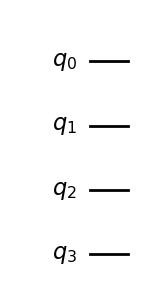

In [30]:
circuit.draw('mpl')

In [61]:
pip install pennylane

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 1.8 MB 11.5 MB/s eta 0:00:01
     |████████████████████████████████| 49 kB 7.8 MB/s  eta 0:00:01
     |████████████████████████████████| 50 kB 12.2 MB/s eta 0:00:01
     |████████████████████████████████| 1.5 MB 34.9 MB/s eta 0:00:01
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [65]:
import numpy as np
import pennylane as qml

a = 0.33
b = 0.75

# matrix to be decomposed
A = np.array(
    [[a,  0, 0,  0],
     [0, -a, 0,  0],
     [0,  0, a,  0],
     [0,  0, 0, -a]]
)

LCU = qml.pauli_decompose(A)
LCU_coeffs, LCU_ops = LCU.terms()

print(f"LCU decomposition:\n {LCU}")
print(f"Coefficients:\n {LCU_coeffs}")
print(f"Unitaries:\n {LCU_ops}")

LCU decomposition:
 0.33 * (I(0) @ Z(1))
Coefficients:
 [0.33]
Unitaries:
 [I(0) @ Z(1)]


In [ ]:
@qml.qnode(dev2)
def lcu_circuit():  # block_encode
    # PREP
    qml.StatePrep(alphas, wires=0)

    # SEL
    qml.Select(unitaries, control=0)

    # PREP_dagger
    qml.adjoint(qml.StatePrep(alphas, wires=0))
    return qml.state()


output_matrix = qml.matrix(lcu_circuit)()
print("A:\n", A, "\n")
print("Block-encoded A:\n")
print(np.real(np.round(output_matrix,2)))

oracle based block encodiing


In [82]:
alpha, beta, gamma  = 0.1, 0., 0.

A = np.array([[alpha, gamma,     0,     0,     0,     0,     0,  beta],
              [ beta, alpha, gamma,     0,     0,     0,     0,     0],
              [    0,  beta, alpha, gamma,     0,     0,     0,     0],
              [    0,     0,  beta, alpha, gamma,     0,     0,     0],
              [    0,     0,     0,  beta, alpha, gamma,     0,     0],
              [    0,     0,     0,     0,  beta, alpha, gamma,     0],
              [    0,     0,     0,     0,     0,  beta, alpha, gamma],
              [gamma,     0,     0,     0,     0,     0,  beta, alpha]])

print(f"Original A:\n{A}", "\n")

Original A:
[[0.1 0.  0.  0.  0.  0.  0.  0. ]
 [0.  0.1 0.  0.  0.  0.  0.  0. ]
 [0.  0.  0.1 0.  0.  0.  0.  0. ]
 [0.  0.  0.  0.1 0.  0.  0.  0. ]
 [0.  0.  0.  0.  0.1 0.  0.  0. ]
 [0.  0.  0.  0.  0.  0.1 0.  0. ]
 [0.  0.  0.  0.  0.  0.  0.1 0. ]
 [0.  0.  0.  0.  0.  0.  0.  0.1]] 



In [83]:
s = int(np.log2(A.shape[0]))  # number of qubits needed to encode A

ancilla_wires = ["ancilla"]   # always 1 qubit for controlled rotations
wires_i = ["i0", "i1"]        # depends on the sparse structure of A
wires_j = [f"j{index}" for index in range(s)]  # depends on the size of A

In [84]:
def UA(theta, wire_i, ancilla):
    qml.ctrl(qml.RY, control=wire_i, control_values=[0, 0])(theta[0], wires=ancilla)
    qml.ctrl(qml.RY, control=wire_i, control_values=[1, 0])(theta[1], wires=ancilla)
    qml.ctrl(qml.RY, control=wire_i, control_values=[0, 1])(theta[2], wires=ancilla)

In [85]:
def shift_op(s_wires, shift="Left"):
    for index in range(len(s_wires)-1, 0, -1):
        control_values = [1] * index if shift == "Left" else [0] * index
        qml.ctrl(qml.PauliX, control=s_wires[:index], control_values=control_values)(wires=s_wires[index])
    qml.PauliX(s_wires[0])


def UB(wires_i, wires_j):
    qml.ctrl(shift_op, control=wires_i[0])(wires_j, shift="Left")
    qml.ctrl(shift_op, control=wires_i[1])(wires_j, shift="Right")

In [86]:
def HN(input_wires):
    for w in input_wires:
        qml.Hadamard(wires=w)

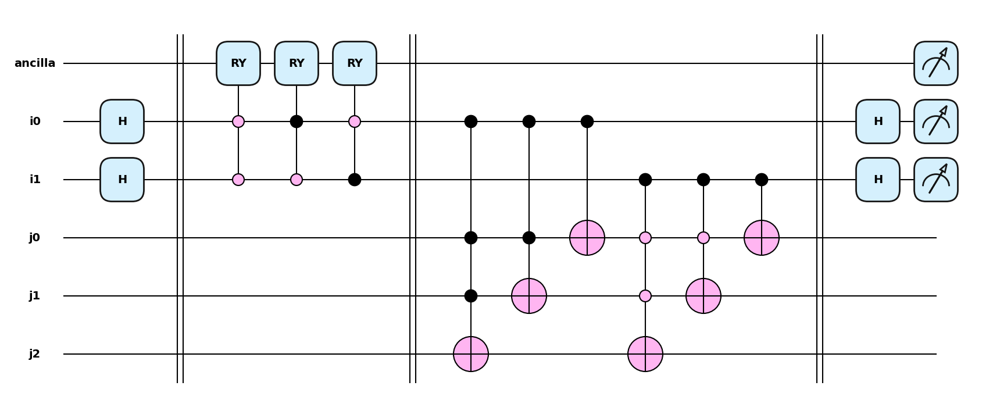

In [87]:
dev = qml.device("default.qubit", wires=(ancilla_wires + wires_i + wires_j))

@qml.qnode(dev)
def complete_circuit(thetas):
    HN(wires_i)
    qml.Barrier() # to separate the sections in the circuit
    UA(thetas, wires_i, ancilla_wires)
    qml.Barrier()
    UB(wires_i, wires_j)
    qml.Barrier()
    HN(wires_i)
    return qml.probs(wires=ancilla_wires + wires_i)

s = 4  # normalization constant
thetas = 2 * np.arccos(np.array([alpha - 1, beta, gamma]))

qml.draw_mpl(complete_circuit, style='pennylane')(thetas)
plt.show()

In [88]:
print("\nBlockEncoded Mat:")
wire_order = ancilla_wires + wires_i[::-1] + wires_j[::-1]
mat = qml.matrix(complete_circuit, wire_order=wire_order)(thetas).real[:len(A), :len(A)] * s
print(mat, "\n")


BlockEncoded Mat:
[[1.000000e-01 6.123234e-17 0.000000e+00 0.000000e+00 0.000000e+00
  0.000000e+00 0.000000e+00 6.123234e-17]
 [6.123234e-17 1.000000e-01 6.123234e-17 0.000000e+00 0.000000e+00
  0.000000e+00 0.000000e+00 0.000000e+00]
 [0.000000e+00 6.123234e-17 1.000000e-01 6.123234e-17 0.000000e+00
  0.000000e+00 0.000000e+00 0.000000e+00]
 [0.000000e+00 0.000000e+00 6.123234e-17 1.000000e-01 6.123234e-17
  0.000000e+00 0.000000e+00 0.000000e+00]
 [0.000000e+00 0.000000e+00 0.000000e+00 6.123234e-17 1.000000e-01
  6.123234e-17 0.000000e+00 0.000000e+00]
 [0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 6.123234e-17
  1.000000e-01 6.123234e-17 0.000000e+00]
 [0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00
  6.123234e-17 1.000000e-01 6.123234e-17]
 [6.123234e-17 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00
  0.000000e+00 6.123234e-17 1.000000e-01]] 



In [89]:
print(mat)

[[1.000000e-01 6.123234e-17 0.000000e+00 0.000000e+00 0.000000e+00
  0.000000e+00 0.000000e+00 6.123234e-17]
 [6.123234e-17 1.000000e-01 6.123234e-17 0.000000e+00 0.000000e+00
  0.000000e+00 0.000000e+00 0.000000e+00]
 [0.000000e+00 6.123234e-17 1.000000e-01 6.123234e-17 0.000000e+00
  0.000000e+00 0.000000e+00 0.000000e+00]
 [0.000000e+00 0.000000e+00 6.123234e-17 1.000000e-01 6.123234e-17
  0.000000e+00 0.000000e+00 0.000000e+00]
 [0.000000e+00 0.000000e+00 0.000000e+00 6.123234e-17 1.000000e-01
  6.123234e-17 0.000000e+00 0.000000e+00]
 [0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 6.123234e-17
  1.000000e-01 6.123234e-17 0.000000e+00]
 [0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00
  6.123234e-17 1.000000e-01 6.123234e-17]
 [6.123234e-17 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00
  0.000000e+00 6.123234e-17 1.000000e-01]]


In [81]:
from qiskit import QuantumCircuit
from qiskit.circuit.library import UnitaryGate
 
matrix = [[ 0.25,  0.,    0.,    0.75, -0.43,  0.,    0.,    0.43],
 [ 0.,   -0.25,  0.75,  0.,    0.,    0.43,  0.43,  0.  ],
 [ 0.,    0.75,  0.25,  0.,    0.,    0.43, -0.43,  0.  ],
 [ 0.75,  0.,    0.,   -0.25,  0.43,  0.,    0.,    0.43],
 [-0.43,  0.,    0.,    0.43,  0.75,  0.,    0.,    0.25],
 [ 0.,    0.43,  0.43,  0.,    0.,   -0.75,  0.25,  0.  ],
 [ 0.,    0.43, -0.43,  0.,    0.,    0.25,  0.75,  0.  ],
 [ 0.43,  0.,    0.,    0.43,  0.25,  0.,    0.,   -0.75]]
# gate = UnitaryGate(matrix)
# gate = UnitaryGate(data, label=None, check_input=True, *, num_qubits=None)
gate = UnitaryGate(matrix, label=None, check_input=True,num_qubits=None)   # unitary checkk is set to false to get around the error pop
# qiskit.circuit.library.UnitaryGate(data, label=None, check_input=True, *, num_qubits=None)
 
qcircuit = QuantumCircuit(4)
qcircuit.append(gate)

ValueError: Input matrix is not unitary.

In [78]:
pip install fable-circuits

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [80]:
from fable import fable
import numpy as np
# from qiskit import Aer
simulator = Aer.get_backend("unitary_simulator")


# generate a random matrix and block encode it
n = 3
N = 2**n
A = np.random.randn(N, N)
circ, alpha = fable(A, 0)
result = simulator.run(circ).result()
unitary = result.get_unitary(circ)
np.linalg.norm(alpha * N * unitary.data[0:N, 0:N] - A)/np.linalg.norm(A)

AttributeError: 'QuantumCircuit' object has no attribute 'cnot'